# **Initial setup**

In [1]:
!pip install Ultralytics
!pip install gdown

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.7 MB/s eta 0:00:00


In [2]:
# Download Dataset
!gdown --id 1q3w__zGz5uQm-ELhfUUBC41NjfaiElss

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1q3w__zGz5uQm-ELhfUUBC41NjfaiElss
From (redirected): https://drive.google.com/uc?id=1q3w__zGz5uQm-ELhfUUBC41NjfaiElss&confirm=t&uuid=6f7c569a-f14e-40bc-85d1-f1c77951ac39
To: /content/datasets.zip
100% 2.85G/2.85G [00:32<00:00, 88.7MB/s]


In [3]:
# Unzip Dataset
!unzip -q datasets.zip -d "/content/"

# Imports

In [4]:
#Imports
import os
import cv2
import yaml
import shutil
import numpy as np
import seaborn as sns
import sklearn
from sklearn.metrics import confusion_matrix
from matplotlib import pyplot as plt
from pathlib import Path
from ultralytics import YOLO
from IPython.display import display, Image


print("Libraries imported.")

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Libraries imported.


In [5]:
# Function to load dataset configuration
def load_dataset_config(dataset_path):
    data_yaml_path = Path(dataset_path) / 'data.yaml'

    if not data_yaml_path.is_file():
        return None

    try:
        with open(data_yaml_path, 'r') as f:
            config = yaml.safe_load(f)

        dataset_root = data_yaml_path.parent
        # Correct relative paths to be absolute for the Colab environment
        for key in ['train', 'val', 'test']:
            if key in config and config[key]:
                path_in_yaml = Path(config[key])
                if not path_in_yaml.is_absolute():
                    absolute_path = (dataset_root / path_in_yaml).resolve()
                    config[key] = str(absolute_path)

        return config

    except Exception as e:
        print(f"An unexpected error occurred while loading {data_yaml_path}: {e}")
        return None

print("Configuration loading function is defined.")

Configuration loading function is defined.


In [6]:
PROJECT_ROOT = Path('/content')
DATASETS_DIR = PROJECT_ROOT / 'datasets'
print(f"Project Root set to: {PROJECT_ROOT}")
print(f"Datasets Directory: {DATASETS_DIR}")

# --- Load Object Detection Dataset ---
objects_dataset_path = DATASETS_DIR / 'baseball_rubber_home_glove'
print(f"\n--- Loading Objects Dataset from {objects_dataset_path} ---")
objects_config = load_dataset_config(objects_dataset_path)
if objects_config:
    print("Objects dataset configuration loaded successfully!")
else:
    print(f"FATAL ERROR: Could not load 'data.yaml' from: {objects_dataset_path}")

# --- Load PHC (Player) Detection Dataset ---
phc_dataset_path = DATASETS_DIR / 'phc'
print(f"\n--- Loading PHC Dataset from {phc_dataset_path} ---")
phc_config = load_dataset_config(phc_dataset_path)
if phc_config:
    print("PHC (player) dataset configuration loaded successfully!")
else:
    print(f"FATAL ERROR: Could not load 'data.yaml' from: {phc_dataset_path}")

Project Root set to: /content
Datasets Directory: /content/datasets

--- Loading Objects Dataset from /content/datasets/baseball_rubber_home_glove ---
Objects dataset configuration loaded successfully!

--- Loading PHC Dataset from /content/datasets/phc ---
PHC (player) dataset configuration loaded successfully!


In [7]:
# Create Corrected `data.yaml` for Object (Plate) Detection

print("\n--- Creating Corrected `data.yaml` for Object Detection Model ---")
colab_objects_yaml_path = None
if objects_config:
    colab_objects_yaml_path = PROJECT_ROOT / 'colab_objects_data.yaml'

    val_path = objects_dataset_path / 'val'
    valid_path = objects_dataset_path / 'valid'
    validation_dir_name = 'valid' if valid_path.exists() else 'val'


    objects_colab_data = {
        'train': str((objects_dataset_path / 'train' / 'images').resolve()),
        'val': str((objects_dataset_path / validation_dir_name / 'images').resolve()),
        'test': str((objects_dataset_path / 'test' / 'images').resolve()),
        'nc': objects_config.get('nc', 4),
        'names': objects_config.get('names', ['glove', 'homeplate', 'baseball', 'rubber'])
    }

    with open(colab_objects_yaml_path, 'w') as f:
        yaml.dump(objects_colab_data, f, sort_keys=False, default_flow_style=False)
    print(f"Data.yaml file created at: {colab_objects_yaml_path}")
else:
    print("Data.yaml not created")


--- Creating Corrected `data.yaml` for Object Detection Model ---
Data.yaml file created at: /content/colab_objects_data.yaml


In [8]:
# Create Corrected `data.yaml` for Player (Hitter) Detection
print("\n--- Creating Corrected `data.yaml` for Player (Hitter) Detection Model ---")
colab_phc_yaml_path = None
if phc_config:
    colab_phc_yaml_path = PROJECT_ROOT / 'colab_phc_data.yaml'

    phc_val_path = phc_dataset_path / 'val'
    phc_valid_path = phc_dataset_path / 'valid'
    phc_validation_dir_name = 'valid' if phc_valid_path.exists() else 'val'

    phc_colab_data = {
        'train': str((phc_dataset_path / 'train' / 'images').resolve()),
        'val': str((phc_dataset_path / phc_validation_dir_name / 'images').resolve()),
        'test': str((phc_dataset_path / 'test' / 'images').resolve()),
        'nc': phc_config.get('nc', 3),
        'names': phc_config.get('names', ['hitter', 'pitcher', 'catcher'])
    }

    with open(colab_phc_yaml_path, 'w') as f:
        yaml.dump(phc_colab_data, f, sort_keys=False, default_flow_style=False)
    print(f"Data.yaml file created at:{colab_phc_yaml_path}")
else:
    print("Data.yaml not created")


--- Creating Corrected `data.yaml` for Player (Hitter) Detection Model ---
Data.yaml file created at:/content/colab_phc_data.yaml


# **Models section**

***Plate Detection Model with YOLOv9***

In [9]:
print("\n--- Fine-tuning Object (Plate) Detection Model with YOLOv9 ---")
plate_detector_model = None
if colab_objects_yaml_path and colab_objects_yaml_path.exists():
    model = YOLO('yolov9c.pt')
    model.train(
        data=str(colab_objects_yaml_path), epochs=25, workers=2, imgsz=640,
        project=str(PROJECT_ROOT / 'runs' / 'detect'), name='plate_train_v9', exist_ok=True
    )
    best_model_path = PROJECT_ROOT / 'runs' / 'detect' / 'plate_train_v9' / 'weights' / 'best.pt'
    if best_model_path.exists():
        print(f"Loading best trained plate detector model from: {best_model_path}")
        plate_detector_model = YOLO(best_model_path)
    else:
        print(f"Could not find trained plate detector model.")
else:
    print("Corrected objects config file not found. Skipping training.")


--- Fine-tuning Object (Plate) Detection Model with YOLOv9 ---


Ultralytics 8.3.184 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/colab_objects_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=25, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9c.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=plate_train_v9, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tr

Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    212864  ultralytics.nn.modules.block.RepNCSPELAN4    [128, 256, 128, 64, 1]        
  3                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
  4                  -1  1    847616  ultralytics.nn.modules.block.RepNCSPELAN4    [256, 512, 256, 128, 1]       
  5                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
  6                  -1  1   2857472  ultralytics.nn.modules.block.RepNCSPELAN4    [512, 512, 512, 256, 1]       
  7                  -1  1    656384  ultralytics

 12                  -1  1   3119616  ultralytics.nn.modules.block.RepNCSPELAN4    [1024, 512, 512, 256, 1]      
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  1    912640  ultralytics.nn.modules.block.RepNCSPELAN4    [1024, 256, 256, 128, 1]      
 16                  -1  1    164352  ultralytics.nn.modules.block.ADown           [256, 256]                    
 17            [-1, 12]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 18                  -1  1   2988544  ultralytics.nn.modules.block.RepNCSPELAN4    [768, 512, 512, 256, 1]       
 19                  -1  1    656384  ultralytics.nn.modules.block.ADown           [512, 512]                    
 20             [-1, 9]  1         0  ultralytics.nn.modules.conv.Concat           [1]  

AMP: checks passed ✅
train: Fast image access ✅ (ping: 0.0±0.0 ms, read: 3475.8±1883.0 MB/s, size: 350.8 KB)


train: Scanning /content/datasets/baseball_rubber_home_glove/train/labels... 3905 images, 20 backgrounds, 142 corrupt: 100%|██████████| 3925/3925 [00:02<00:00, 1554.14it/s]

train: /content/datasets/baseball_rubber_home_glove/train/images/0000022.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
train: /content/datasets/baseball_rubber_home_glove/train/images/0000045.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
train: /content/datasets/baseball_rubber_home_glove/train/images/0000084.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
train: /content/datasets/baseball_rubber_home_glove/train/images/0000138.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
train: /content/datasets/baseball_rubber_home_glove/train/images/0000251.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
train: /content/datasets/baseball_rubber_home_glove/train/images/0000261.jpg: ignorin

train: New cache created: /content/datasets/baseball_rubber_home_glove/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1675.4±1252.3 MB/s, size: 337.6 KB)


val: Scanning /content/datasets/baseball_rubber_home_glove/valid/labels... 97 images, 1 backgrounds, 6 corrupt: 100%|██████████| 98/98 [00:00<00:00, 1537.24it/s]

val: /content/datasets/baseball_rubber_home_glove/valid/images/0001638.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
val: /content/datasets/baseball_rubber_home_glove/valid/images/0002723.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
val: /content/datasets/baseball_rubber_home_glove/valid/images/0004582.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
val: /content/datasets/baseball_rubber_home_glove/valid/images/0004829.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
val: /content/datasets/baseball_rubber_home_glove/valid/images/0007983.jpg: ignoring corrupt image/label: Label class 4 exceeds dataset class count 4. Possible class labels are 0-3
val: /content/datasets/baseball_rubber_home_glove/valid/images/0008165.jpg: ignoring corrupt im

Plotting labels to /content/runs/detect/plate_train_v9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/runs/detect/plate_train_v9
Starting training for 25 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/25      10.6G       2.32      2.199       1.04         35        640: 100%|██████████| 237/237 [00:56<00:00,  4.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:01<00:00,  2.00it/s]

                   all         92        350      0.704      0.679      0.686      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/25      10.6G      2.221      1.261     0.9986         48        640: 100%|██████████| 237/237 [00:47<00:00,  5.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.15it/s]

                   all         92        350      0.635      0.675      0.676      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/25      10.7G      2.185      1.228     0.9918         61        640: 100%|██████████| 237/237 [00:46<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.09it/s]

                   all         92        350      0.672      0.685      0.691      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/25      10.8G      2.133      1.179      0.976         61        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.10it/s]

                   all         92        350      0.632      0.783      0.722      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/25      10.8G      2.091      1.143     0.9701         25        640: 100%|██████████| 237/237 [00:45<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.13it/s]

                   all         92        350      0.682      0.752      0.742      0.282



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/25      10.9G       2.06       1.13     0.9621         29        640: 100%|██████████| 237/237 [00:45<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.13it/s]

                   all         92        350      0.737      0.794      0.759      0.312



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/25        11G      2.038      1.102     0.9571         67        640: 100%|██████████| 237/237 [00:45<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.62it/s]

                   all         92        350      0.741      0.785      0.775      0.319



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/25      11.1G      1.995      1.064     0.9488         62        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.02it/s]

                   all         92        350      0.766      0.801      0.789      0.315



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/25      11.1G      1.988      1.067     0.9481         37        640: 100%|██████████| 237/237 [00:45<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.15it/s]

                   all         92        350      0.766      0.824      0.826      0.339



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/25      11.6G      1.967      1.045     0.9453         39        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.08it/s]

                   all         92        350       0.81      0.814       0.81      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/25      11.7G      1.959      1.048     0.9428         51        640: 100%|██████████| 237/237 [00:45<00:00,  5.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.84it/s]

                   all         92        350      0.739      0.838      0.809      0.331



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/25      11.8G      1.925      1.028     0.9377         47        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.99it/s]

                   all         92        350      0.742      0.856      0.798      0.349



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/25      11.8G      1.912      1.008     0.9318         56        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.08it/s]

                   all         92        350      0.763      0.832      0.817      0.345



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/25      11.9G      1.891      1.009     0.9289         45        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.99it/s]

                   all         92        350      0.772       0.82      0.802      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/25        12G      1.886     0.9894     0.9262         57        640: 100%|██████████| 237/237 [00:45<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.78it/s]

                   all         92        350      0.765      0.846      0.843       0.36


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/25      12.9G      1.854      1.001     0.9563         28        640: 100%|██████████| 237/237 [00:46<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.91it/s]

                   all         92        350      0.759      0.818      0.811      0.342



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/25      12.9G      1.841     0.9816     0.9512         24        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.96it/s]

                   all         92        350       0.76       0.86       0.83      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/25        13G      1.821      0.977     0.9472         27        640: 100%|██████████| 237/237 [00:45<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.10it/s]

                   all         92        350      0.768      0.825      0.798      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/25      13.1G      1.811     0.9695     0.9494         26        640: 100%|██████████| 237/237 [00:45<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.05it/s]

                   all         92        350       0.78      0.816      0.837      0.364



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/25      13.2G      1.804      0.968     0.9477         28        640: 100%|██████████| 237/237 [00:45<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.97it/s]

                   all         92        350       0.77      0.864      0.835      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/25      13.2G      1.785     0.9492     0.9403         28        640: 100%|██████████| 237/237 [00:45<00:00,  5.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.10it/s]

                   all         92        350      0.775      0.849      0.829      0.361



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/25      13.3G      1.767     0.9404     0.9344         27        640: 100%|██████████| 237/237 [00:45<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.09it/s]

                   all         92        350      0.787      0.854      0.838      0.365



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/25      13.4G       1.76      0.929     0.9345         27        640: 100%|██████████| 237/237 [00:45<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.91it/s]

                   all         92        350      0.792      0.873      0.853      0.368



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/25      13.5G      1.736     0.9237     0.9331         26        640: 100%|██████████| 237/237 [00:45<00:00,  5.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  6.69it/s]

                   all         92        350      0.781      0.896      0.841      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/25      13.5G      1.721     0.9132     0.9302         26        640: 100%|██████████| 237/237 [00:45<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  7.03it/s]

                   all         92        350      0.802      0.863      0.862      0.391



25 epochs completed in 0.330 hours.
Optimizer stripped from /content/runs/detect/plate_train_v9/weights/last.pt, 51.6MB
Optimizer stripped from /content/runs/detect/plate_train_v9/weights/best.pt, 51.6MB

Validating /content/runs/detect/plate_train_v9/weights/best.pt...
Ultralytics 8.3.184 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9c summary (fused): 156 layers, 25,322,332 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:00<00:00,  4.13it/s]


                   all         92        350      0.801      0.864      0.861       0.39
                 glove         90         90      0.872      0.889      0.908      0.467
             homeplate         87         87      0.646      0.901      0.783      0.363
              baseball         91         91      0.925      0.923      0.936      0.428
                rubber         82         82      0.762      0.744      0.815      0.301
Speed: 0.1ms preprocess, 1.9ms inference, 0.0ms loss, 1.2ms postprocess per image
Results saved to /content/runs/detect/plate_train_v9
Loading best trained plate detector model from: /content/runs/detect/plate_train_v9/weights/best.pt


***Player (Hitter) Detection Model with YOLOv9***

In [10]:
print("\n--- Fine-tuning Player (Hitter) Detection Model with YOLOv9 ---")
hitter_detector_model = None
if colab_phc_yaml_path and colab_phc_yaml_path.exists():
    model = YOLO('yolov9c.pt')
    model.train(
        task='detect',
        data=str(colab_phc_yaml_path),
        epochs=20,
        workers=2,
        imgsz=640,
        project=str(PROJECT_ROOT / 'runs' / 'detect'),
        name='hitter_train_v9',
        exist_ok=True
    )
    best_model_path = PROJECT_ROOT / 'runs' / 'detect' / 'hitter_train_v9' / 'weights' / 'best.pt'
    if best_model_path.exists():
        print(f"Loading best trained hitter detector model from: {best_model_path}")
        hitter_detector_model = YOLO(best_model_path)
    else:
        print(f"Could not find trained hitter detector model.")
else:
    print("Corrected PHC config file not found. Skipping training.")



--- Fine-tuning Player (Hitter) Detection Model with YOLOv9 ---
Ultralytics 8.3.184 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/colab_phc_data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov9c.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=hitter_train_v9, nbs=64, nms=False, opset=None, optimize=False, optimizer=au

train: Scanning /content/datasets/phc/train/labels... 3272 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3272/3272 [00:02<00:00, 1528.63it/s]

train: New cache created: /content/datasets/phc/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 807.8±19.0 MB/s, size: 327.1 KB)


val: Scanning /content/datasets/phc/val/labels... 409 images, 0 backgrounds, 0 corrupt: 100%|██████████| 409/409 [00:00<00:00, 148783.20it/s]

val: New cache created: /content/datasets/phc/val/labels.cache


Plotting labels to /content/runs/detect/hitter_train_v9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001429, momentum=0.9) with parameter groups 154 weight(decay=0.0), 161 weight(decay=0.0005), 160 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/runs/detect/hitter_train_v9
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      11.2G      1.022     0.7497       1.15         44        640: 100%|██████████| 205/205 [00:48<00:00,  4.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  6.17it/s]

                   all        409       1225      0.935      0.932      0.974      0.684



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      11.2G      1.003     0.5312      1.153         39        640: 100%|██████████| 205/205 [00:41<00:00,  4.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.86it/s]

                   all        409       1225      0.985       0.99      0.992      0.733



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      11.2G     0.9894     0.5026       1.14         41        640: 100%|██████████| 205/205 [00:40<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.78it/s]

                   all        409       1225      0.977      0.991      0.992      0.757



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      11.2G     0.9709     0.4749      1.132         55        640: 100%|██████████| 205/205 [00:39<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.70it/s]

                   all        409       1225      0.994      0.993      0.994      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      11.2G      0.939     0.4463      1.125         39        640: 100%|██████████| 205/205 [00:39<00:00,  5.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.75it/s]

                   all        409       1225      0.993      0.997      0.994      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      11.2G     0.9249     0.4259      1.106         43        640: 100%|██████████| 205/205 [00:39<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.74it/s]

                   all        409       1225      0.996      0.998      0.994      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      11.2G     0.9038     0.4094      1.105         38        640: 100%|██████████| 205/205 [00:39<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.69it/s]

                   all        409       1225      0.995      0.998      0.994      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      11.2G     0.8943     0.4022      1.082         39        640: 100%|██████████| 205/205 [00:39<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.74it/s]

                   all        409       1225      0.996      0.996      0.993      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      11.2G     0.8766     0.3893      1.082         54        640: 100%|██████████| 205/205 [00:39<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.78it/s]

                   all        409       1225      0.997      0.997      0.995      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      11.2G     0.8655     0.3755      1.083         39        640: 100%|██████████| 205/205 [00:39<00:00,  5.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.80it/s]

                   all        409       1225      0.998      0.999      0.993      0.806


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      11.2G     0.8364      0.327      1.061         24        640: 100%|██████████| 205/205 [00:40<00:00,  5.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.65it/s]

                   all        409       1225      0.998      0.998      0.995      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      11.2G     0.8331     0.3214      1.048         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.78it/s]

                   all        409       1225      0.997      0.999      0.994        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      11.2G     0.8181     0.3152      1.062         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.61it/s]

                   all        409       1225      0.997      0.998      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      11.2G     0.8099     0.3091      1.053         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.68it/s]

                   all        409       1225      0.998      0.999      0.994      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20      11.2G     0.8004     0.3003      1.029         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.66it/s]

                   all        409       1225      0.997      0.999      0.994       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20      11.2G      0.793     0.2929      1.029         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.83it/s]

                   all        409       1225      0.998      0.998      0.994      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20      11.2G     0.7814     0.2812      1.009         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.62it/s]

                   all        409       1225      0.998      0.999      0.994      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20      11.2G     0.7726     0.2762     0.9961         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.72it/s]

                   all        409       1225      0.998      0.999      0.994      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20      11.2G     0.7648       0.27      1.001         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.65it/s]

                   all        409       1225      0.998      0.998      0.994      0.819



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20      11.2G     0.7514     0.2618      1.007         24        640: 100%|██████████| 205/205 [00:39<00:00,  5.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:01<00:00,  6.84it/s]

                   all        409       1225      0.998      0.999      0.994      0.823



20 epochs completed in 0.241 hours.
Optimizer stripped from /content/runs/detect/hitter_train_v9/weights/last.pt, 51.6MB
Optimizer stripped from /content/runs/detect/hitter_train_v9/weights/best.pt, 51.6MB

Validating /content/runs/detect/hitter_train_v9/weights/best.pt...
Ultralytics 8.3.184 🚀 Python-3.12.11 torch-2.8.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
YOLOv9c summary (fused): 156 layers, 25,321,561 parameters, 0 gradients, 102.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 13/13 [00:02<00:00,  4.81it/s]


                   all        409       1225      0.998      0.999      0.994      0.823
                hitter        407        407      0.995      0.998      0.992       0.79
               pitcher        409        409          1          1      0.995      0.856
               catcher        409        409          1          1      0.995      0.823
Speed: 0.1ms preprocess, 1.6ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to /content/runs/detect/hitter_train_v9
Loading best trained hitter detector model from: /content/runs/detect/hitter_train_v9/weights/best.pt



--- Running Final Validation with Multi-Model Pipeline on Still Images ---



--- Pre-Check ---
Plate Detector Model Loaded: PLATE DETECTOR READY
Hitter Detector Model Loaded: HITTER DETECTOR READY
Validation Images Found: FOUND (30 images)
------------------------


--- Processing: 0004582.jpg ---
Home plate NOT DETECTED by plate model.

--- Processing: 0009794.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


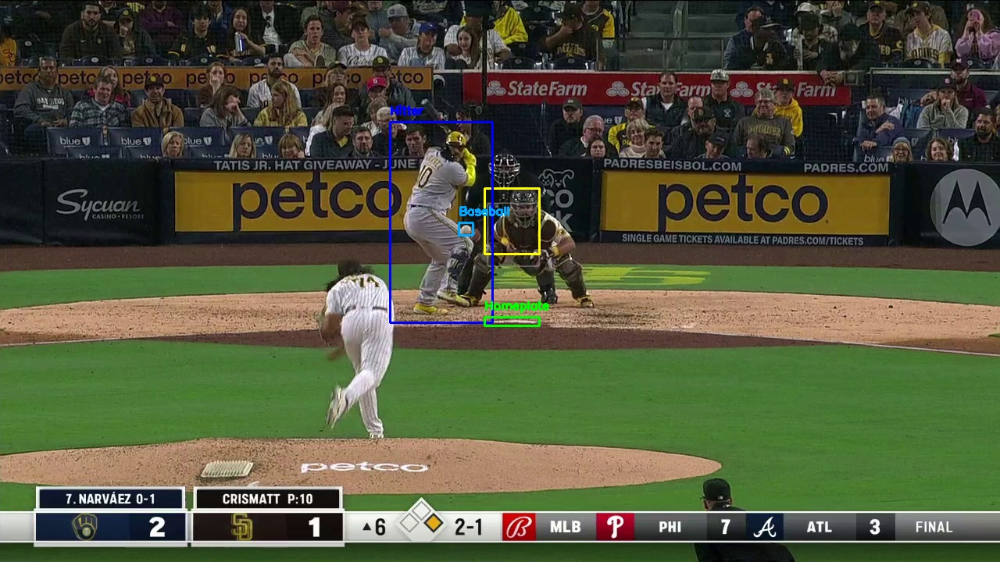


--- Processing: 0000040.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


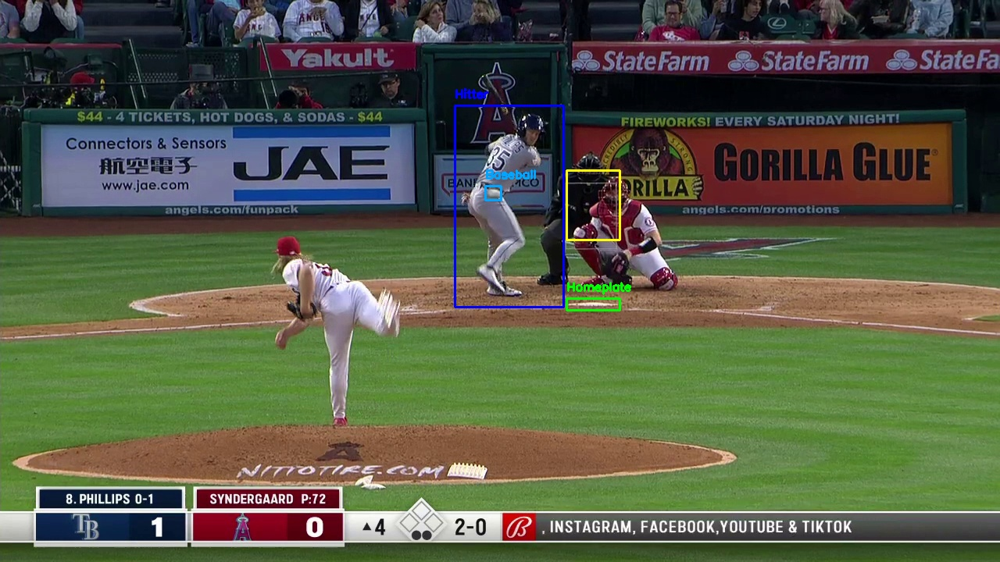


--- Processing: 0009447.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


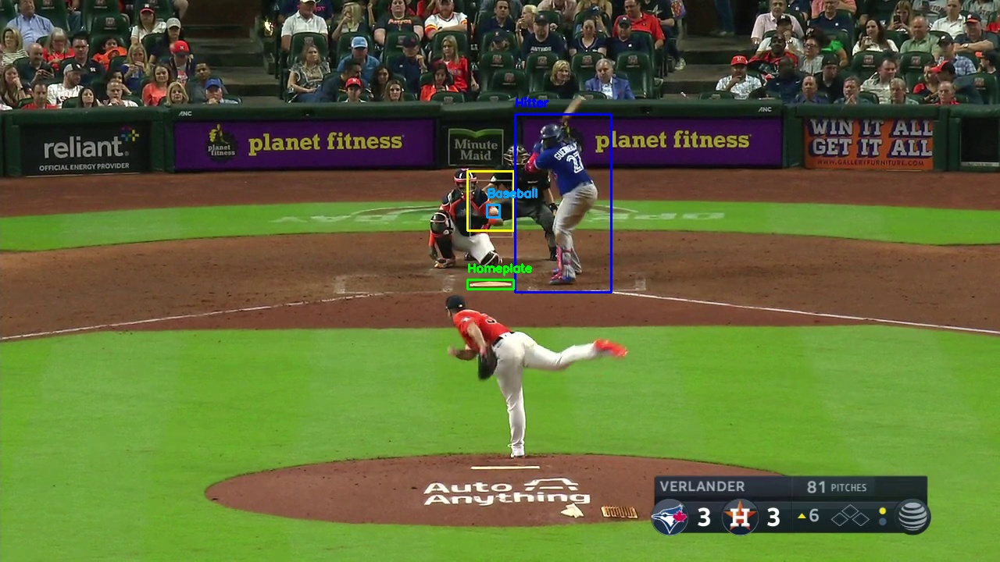


--- Processing: 0004256.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


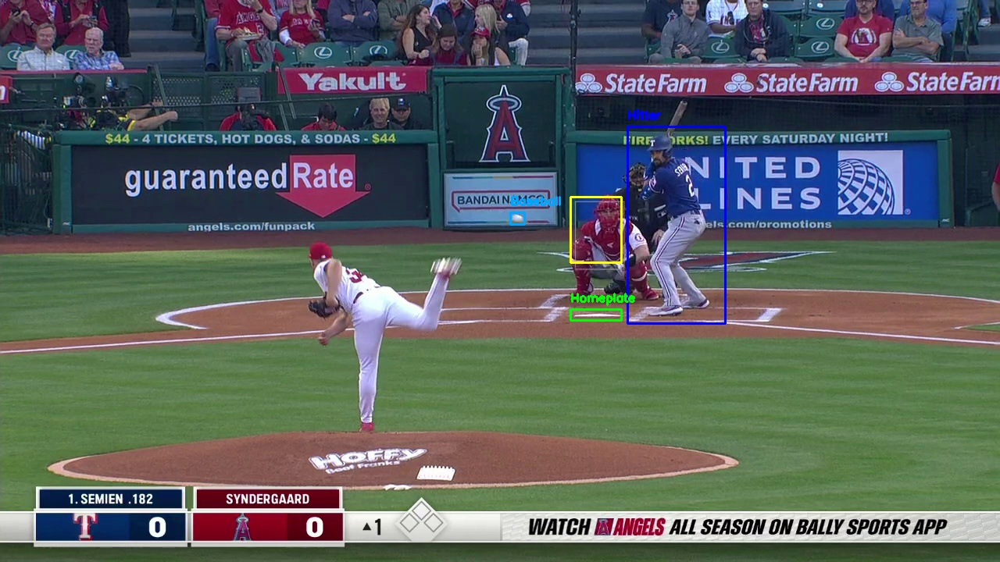


--- Processing: 0007867.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


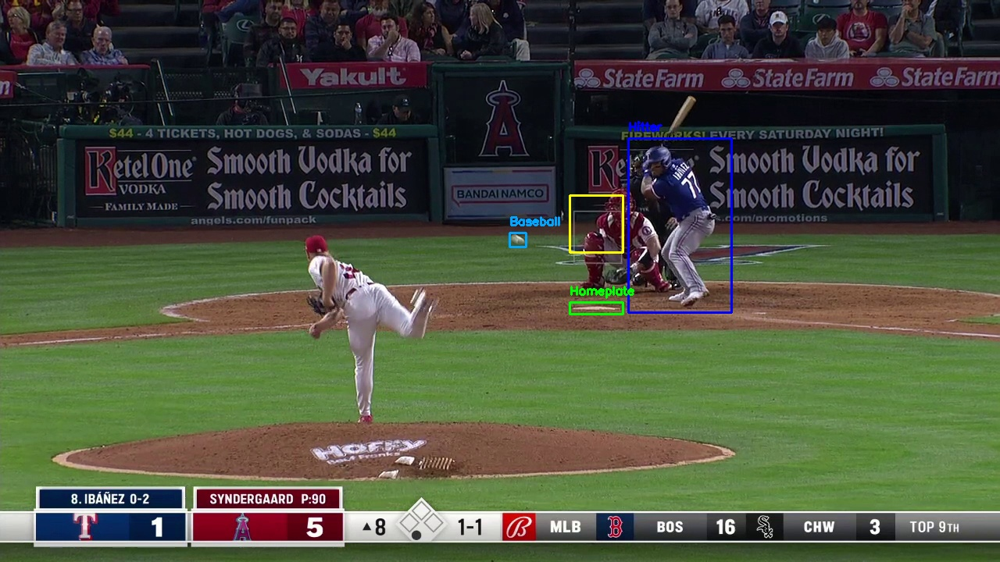


--- Processing: 0003618.jpg ---
Home plate NOT DETECTED by plate model.

--- Processing: 0007295.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


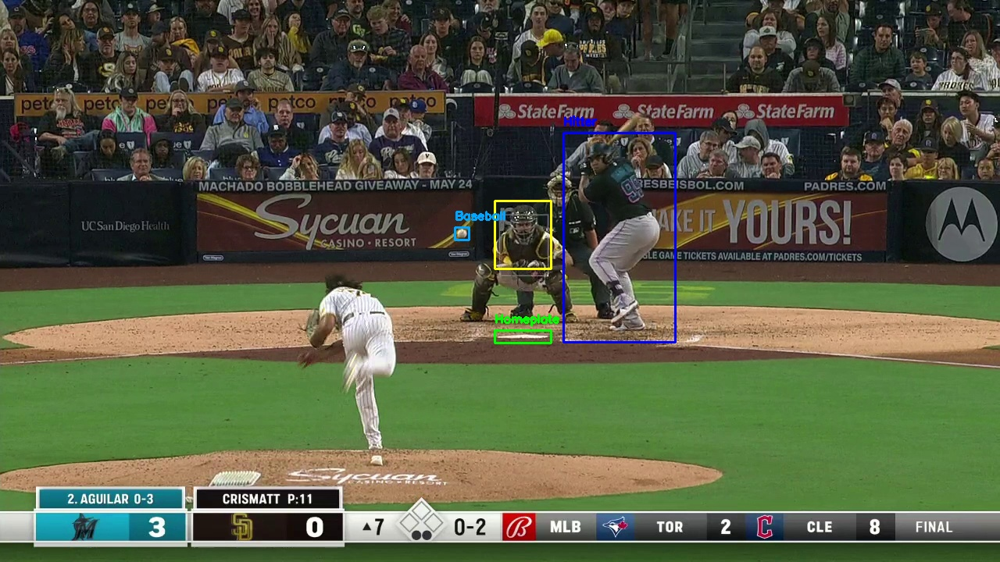


--- Processing: 0000386.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


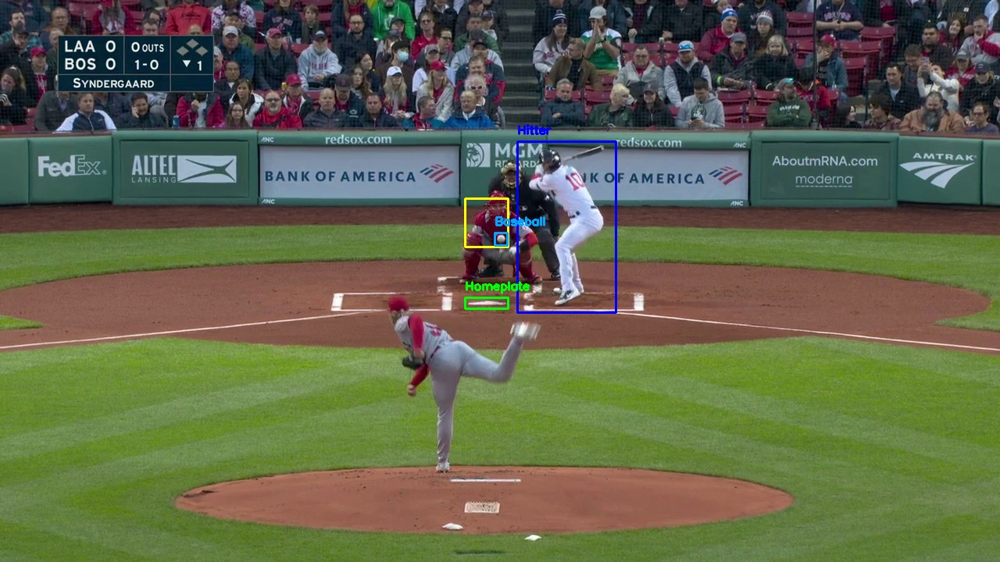


--- Processing: 0002993.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


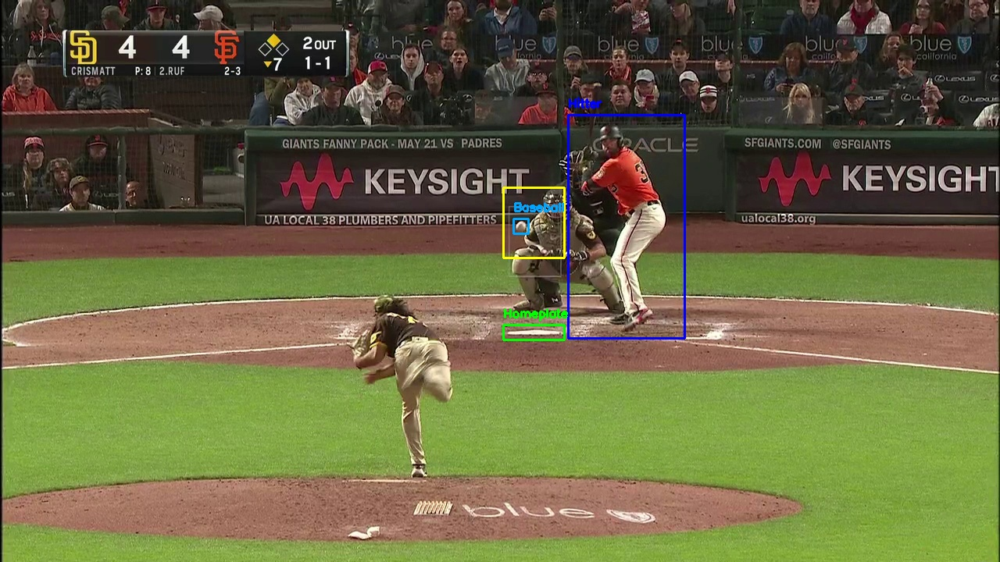


--- Processing: 0003620.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


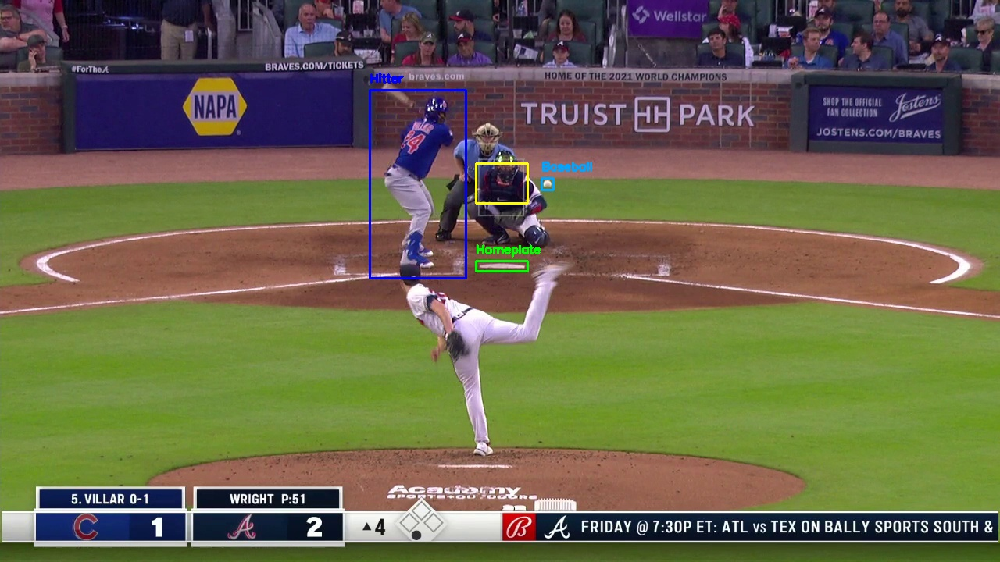


--- Processing: 0006766.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


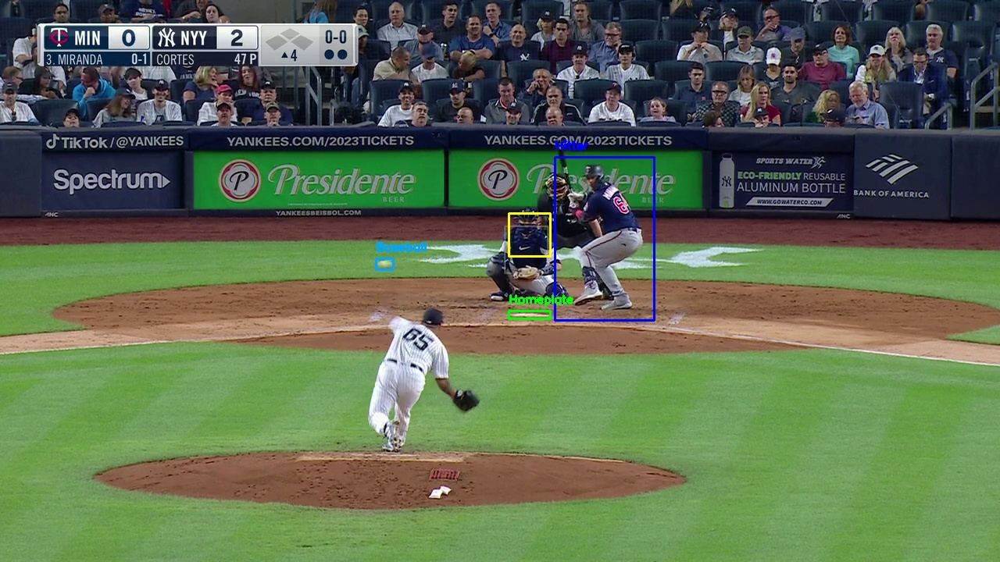


--- Processing: 0005866.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball NOT DETECTED in this frame.


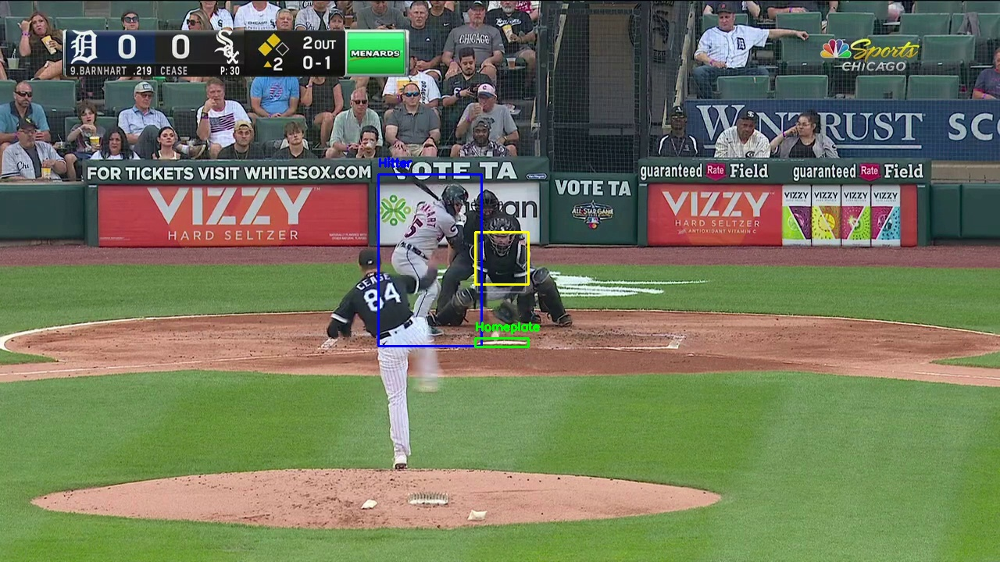


--- Processing: 0009005.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


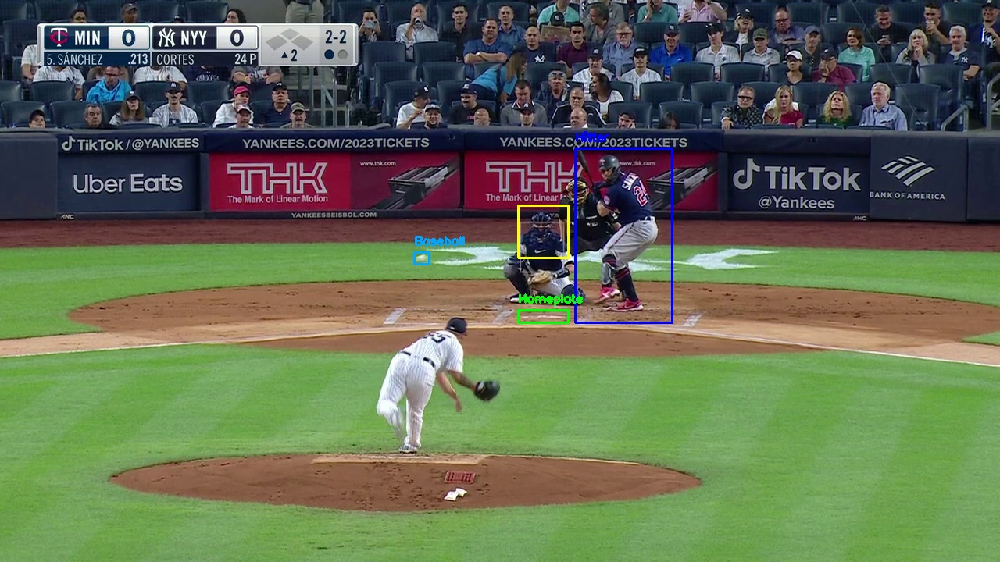


--- Processing: 0000926.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


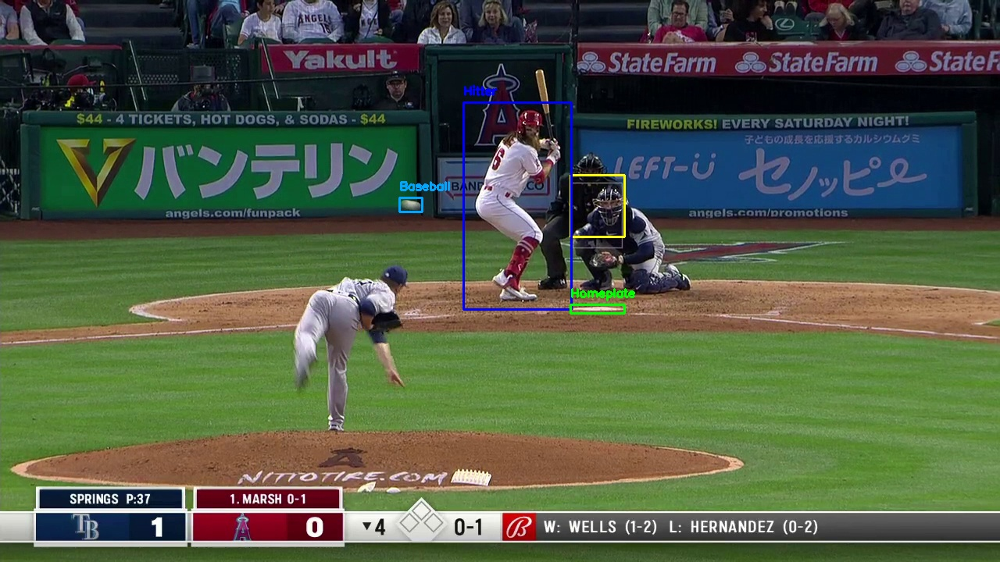


--- Processing: 0009997.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


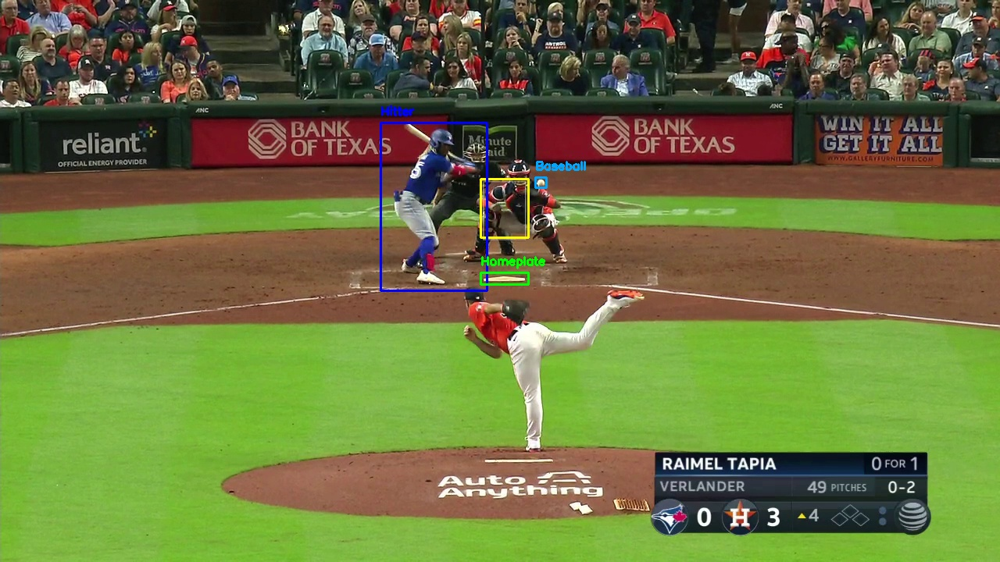


--- Processing: 0002535.jpg ---
Home plate NOT DETECTED by plate model.

--- Processing: 0009315.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


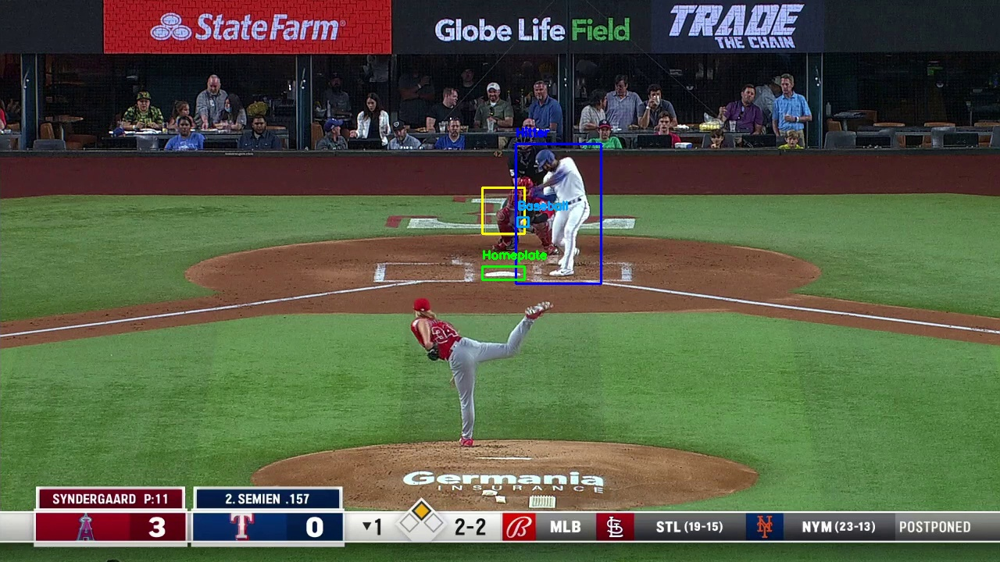


--- Processing: 0002238.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


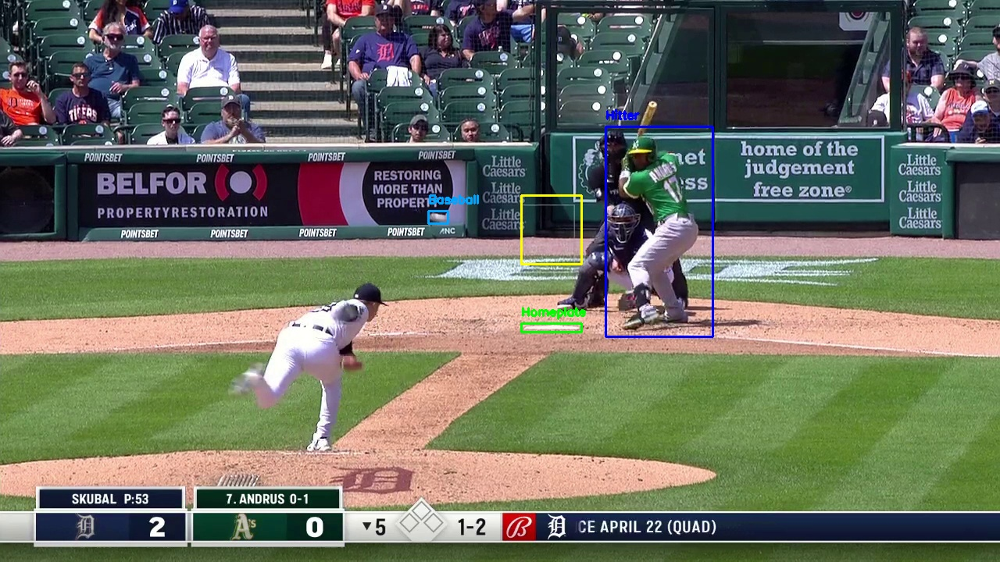


--- Processing: 0008584.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


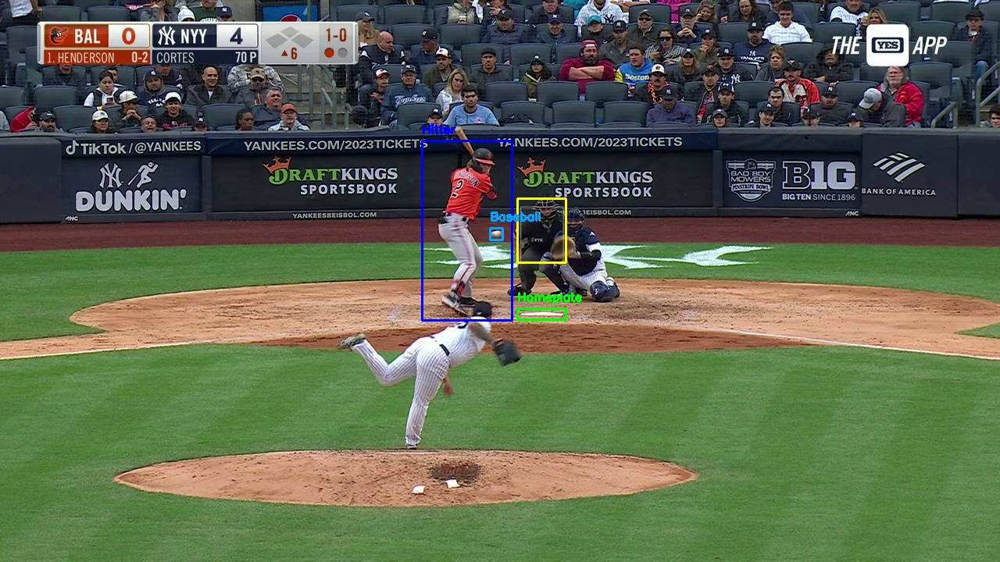


--- Processing: 0005507.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


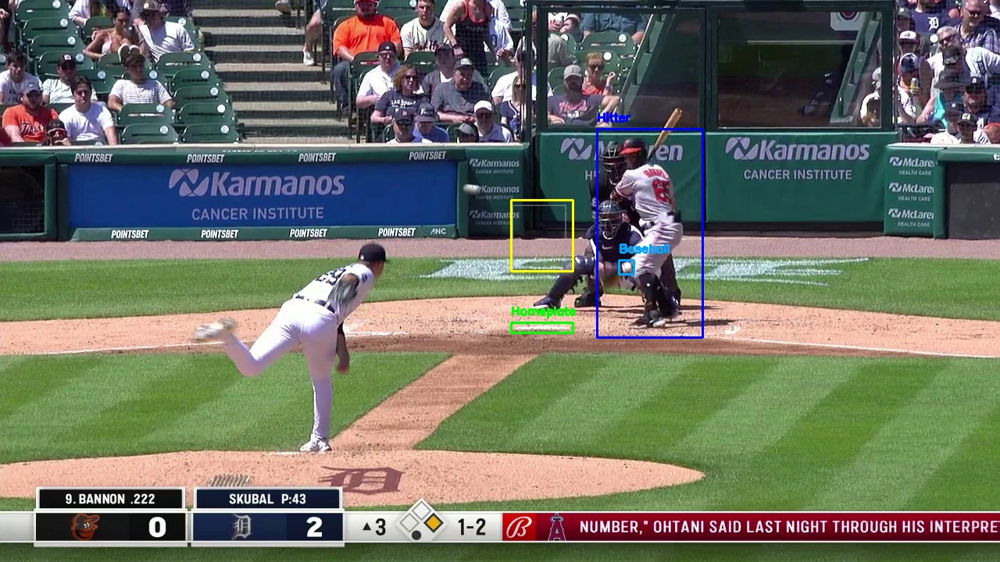


--- Processing: 0006007.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


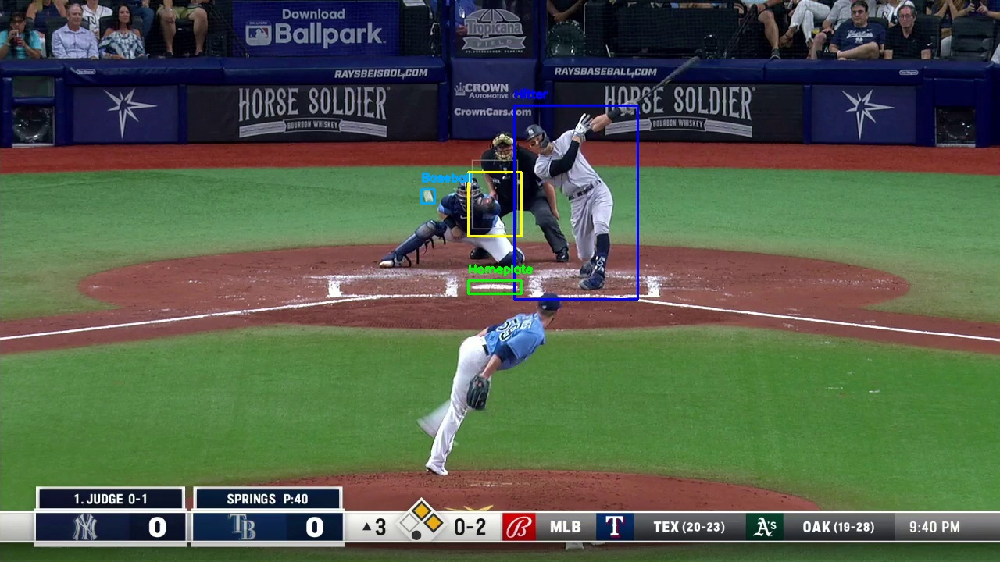


--- Processing: 0003215.jpg ---
Home plate NOT DETECTED by plate model.

--- Processing: 0005761.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


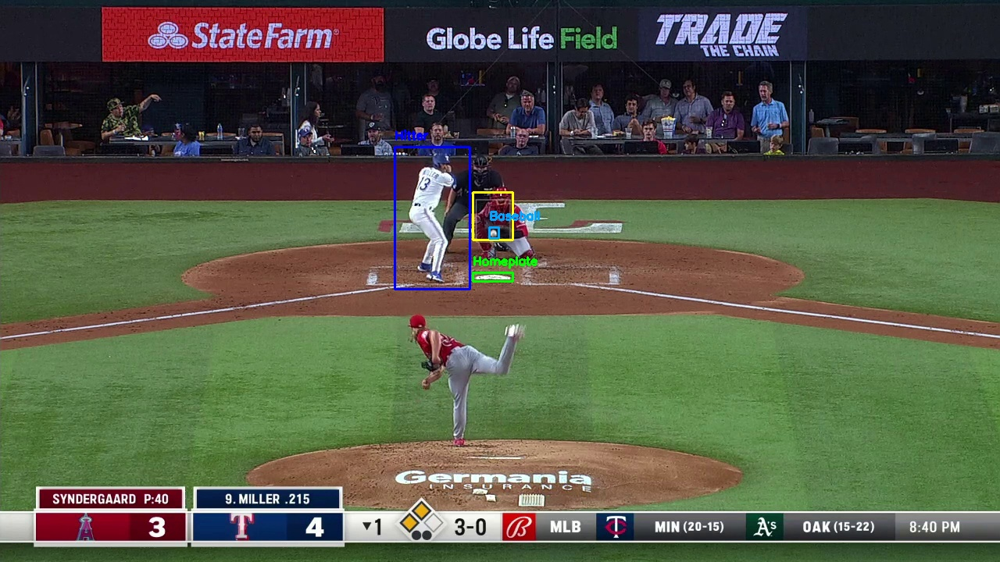


--- Processing: 0008016.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


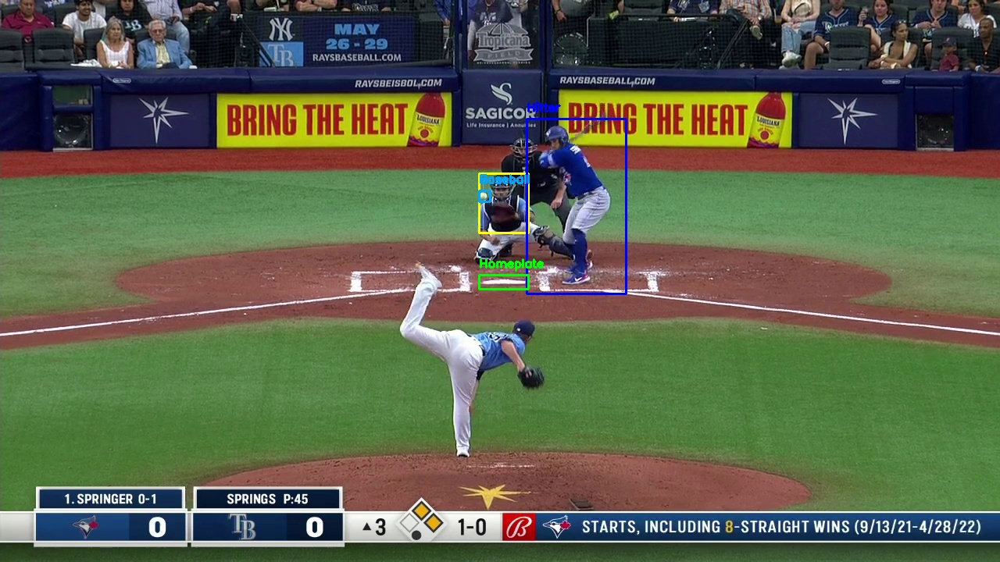


--- Processing: 0000767.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


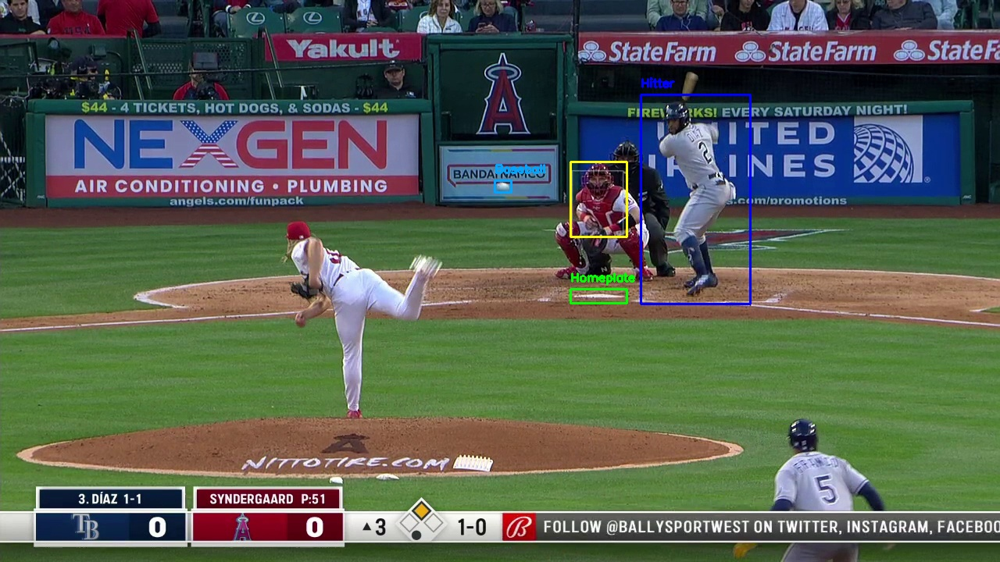


--- Processing: 0001704.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


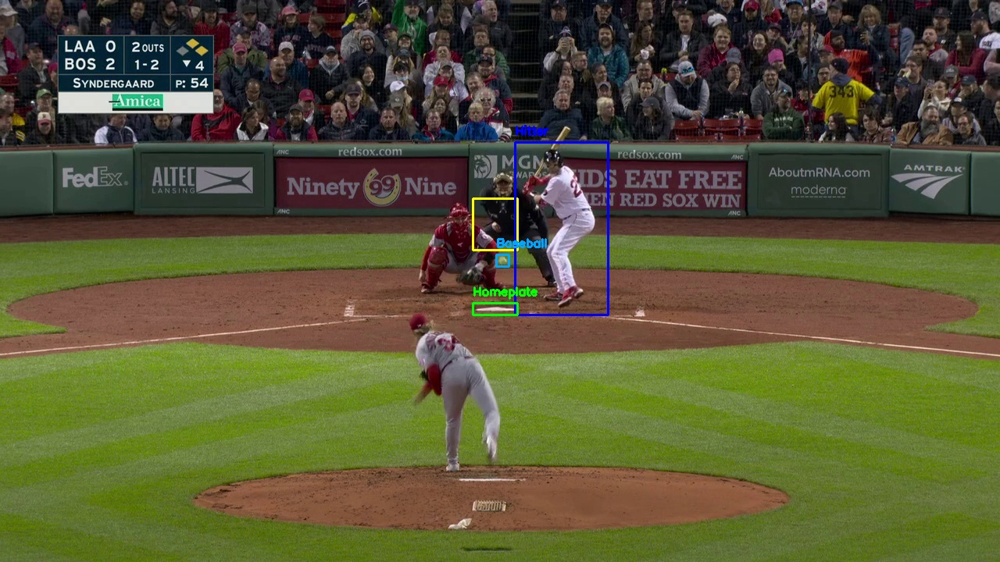


--- Processing: 0008914.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


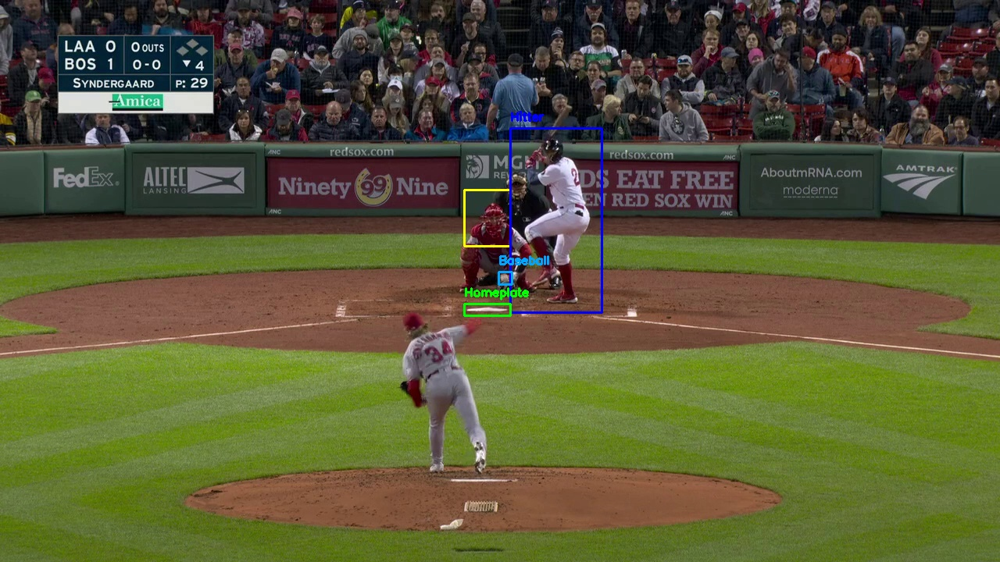


--- Processing: 0000229.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


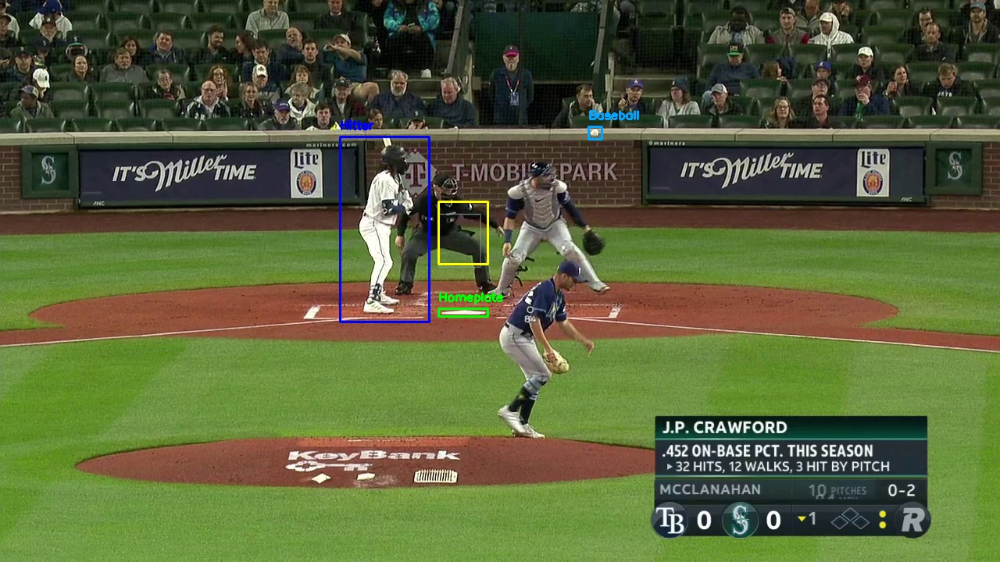


--- Processing: 0002778.jpg ---
Home plate DETECTED.
Hitter class DETECTED by hitter model.
Pose estimated for detected hitter.
Drawing strike zone.
Baseball DETECTED.


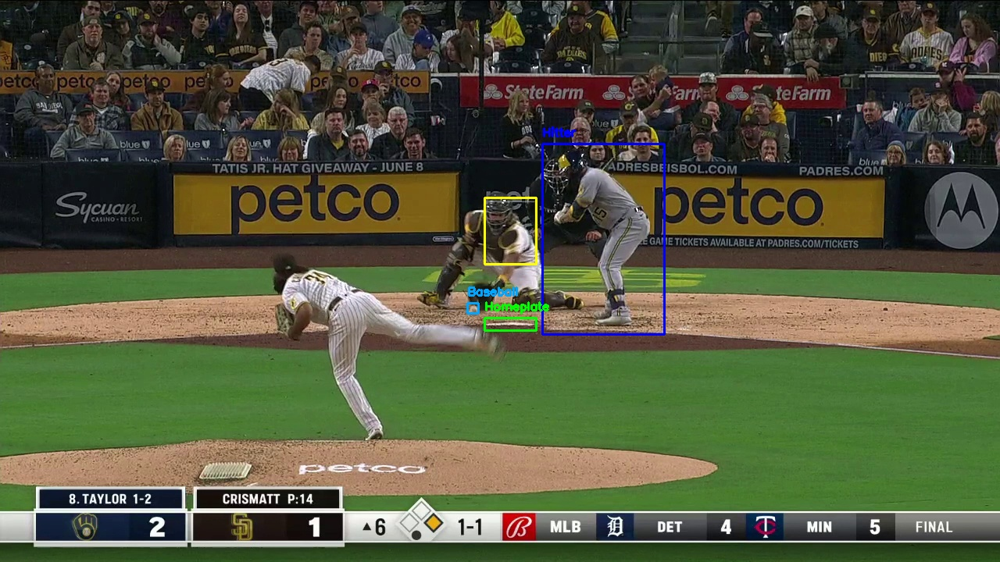

In [11]:
print("\n--- Running Final Validation with Multi-Model Pipeline on Still Images ---")
generic_pose_model = YOLO('yolov8n-pose.pt')

# --- Pre-Check ---
print("\n--- Pre-Check ---")
plate_model_ready = 'plate_detector_model' in locals() and plate_detector_model is not None
hitter_model_ready = 'hitter_detector_model' in locals() and hitter_detector_model is not None
print(f"Plate Detector Model Loaded: {'PLATE DETECTOR READY' if plate_model_ready else 'ERROR PLATE DETECTOR MODEL NOT LOADED'}")
print(f"Hitter Detector Model Loaded: {'HITTER DETECTOR READY' if hitter_model_ready else 'ERROR HITTER DETECTOR MODEL NOT LOADED'}")

num_test_images = 30 # Increased number of images for validation
validation_images = []
# Use validation images from the objects dataset as they contain all elements
if 'objects_colab_data' in locals() and objects_colab_data.get('val'):
    val_images_dir = Path(objects_colab_data['val'])
    if val_images_dir.exists():
        validation_images = list(val_images_dir.glob('*.jpg'))[:num_test_images]

images_found = len(validation_images) > 0
print(f"Validation Images Found: {'FOUND' if images_found else 'ERROR'} ({len(validation_images)} images)")
print("------------------------\n")


if plate_model_ready and hitter_model_ready and images_found:
    for image_path in validation_images:
        print(f"\n--- Processing: {image_path.name} ---")
        img = cv2.imread(str(image_path))

        # Use Plate Detector to find Home Plate and Ball ---
        plate_results = plate_detector_model(img, verbose=False)
        home_plate_box = None
        baseball_box = None

        for box in plate_results[0].boxes:
            class_name = plate_detector_model.names[int(box.cls[0])]
            if class_name == 'homeplate':
                home_plate_box = box.xyxy[0].cpu().numpy()
            elif class_name == 'baseball':
                baseball_box = box.xyxy[0].cpu().numpy()

        if home_plate_box is not None:
            print("Home plate DETECTED.")
        else:
            print("Home plate NOT DETECTED by plate model.")
            continue

        # Use Hitter Detector to find the Hitter ---
        hitter_results = hitter_detector_model(img, verbose=False)
        hitter_box = None
        for box in hitter_results[0].boxes:
            if hitter_detector_model.names[int(box.cls[0])] == 'hitter':
                hitter_box = box.xyxy[0].cpu().numpy()
                print("Hitter class DETECTED by hitter model.")
                break

        if hitter_box is None:
            print("Hitter class NOT DETECTED by hitter model. Skipping.")
            continue

        # Running Generic Pose Model on the Hitter's Bounding Box ---
        x1, y1, x2, y2 = [int(c) for c in hitter_box]
        hitter_crop = img[y1:y2, x1:x2]

        pose_results = generic_pose_model(hitter_crop, verbose=False)
        if not pose_results[0].keypoints or len(pose_results[0].keypoints.xy) == 0:
            print("No pose found within the hitter's bounding box.")
            continue

        # Convert local keypoints from the crop back to global image coordinates
        hitter_keypoints = pose_results[0].keypoints.xy[0].cpu().numpy()
        hitter_keypoints[:, 0] += x1 # Add the crop's x-offset
        hitter_keypoints[:, 1] += y1 # Add the crop's y-offset
        print("Pose estimated for detected hitter.")

        # Define Strike Zone ---
        strike_zone_left = int(home_plate_box[0])
        strike_zone_right = int(home_plate_box[2])
        plate_top_y = int(home_plate_box[1])

        left_shoulder = hitter_keypoints[5]
        right_shoulder = hitter_keypoints[6]
        left_hip = hitter_keypoints[11]
        right_hip = hitter_keypoints[12]
        left_knee = hitter_keypoints[13]
        right_knee = hitter_keypoints[14]

        shoulder_y = (left_shoulder[1] + right_shoulder[1]) / 2
        hip_y = (left_hip[1] + right_hip[1]) / 2
        strike_zone_top = int((shoulder_y + hip_y) / 2) if shoulder_y > 0 and hip_y > 0 else 0
        strike_zone_bottom = int(max(left_knee[1], right_knee[1])) if left_knee[1] > 0 and right_knee[1] > 0 else 0
        strike_zone_bottom = min(strike_zone_bottom, plate_top_y)

        # Drawig all detections on the image
        if strike_zone_bottom > strike_zone_top > 0:
            print("Drawing strike zone.")
            cv2.rectangle(img, (strike_zone_left, strike_zone_top), (strike_zone_right, strike_zone_bottom), (0, 255, 255), 2) # Yellow
        else:
            print("Invalid keypoints for drawing strike zone.")

        # Drawing Hitter Box
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2) # Red
        cv2.putText(img, 'Hitter', (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        # Drawing Home Plate Box
        hp_x1, hp_y1, hp_x2, hp_y2 = [int(c) for c in home_plate_box]
        cv2.rectangle(img, (hp_x1, hp_y1), (hp_x2, hp_y2), (0, 255, 0), 2) # Green
        cv2.putText(img, 'Homeplate', (hp_x1, hp_y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

        # Drawing Baseball Bounding Box
        if baseball_box is not None:
            print("Baseball DETECTED.")
            b_x1, b_y1, b_x2, b_y2 = [int(c) for c in baseball_box]
            cv2.rectangle(img, (b_x1, b_y1), (b_x2, b_y2), (255, 165, 0), 2) # Orange
            cv2.putText(img, 'Baseball', (b_x1, b_y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 165, 0), 2)
        else:
            print("Baseball NOT DETECTED in this frame.")

        # Visualizing and Saving ---
        output_val_path = PROJECT_ROOT / f'temp_final_validation_{image_path.name}'
        cv2.imwrite(str(output_val_path), img)
        display(Image(filename=str(output_val_path)))

else:
    print("Could not run validation.")



In [12]:
# Upload Video Files
from google.colab import files
print("--- Please upload your video files ---")
uploaded = files.upload()
video_paths = []
if uploaded:
    video_paths = list(uploaded.keys())
    print(f"Uploaded {len(video_paths)} video(s): {video_paths}")
else:
    print("No videos uploaded.")

--- Please upload your video files ---


Saving 0014.mp4 to 0014.mp4
Saving 0013.mp4 to 0013.mp4
Saving 0012.mp4 to 0012.mp4
Saving 0011.mp4 to 0011.mp4
Saving 0010.mp4 to 0010.mp4
Saving 0009.mp4 to 0009.mp4
Saving 0008.mp4 to 0008.mp4
Saving 0007.mp4 to 0007.mp4
Saving 0006.mp4 to 0006.mp4
Saving 0005.mp4 to 0005.mp4
Saving 0004.mp4 to 0004.mp4
Saving 0003.mp4 to 0003.mp4
Saving 0002.mp4 to 0002.mp4
Saving 0001.mp4 to 0001.mp4
Uploaded 14 video(s): ['0014.mp4', '0013.mp4', '0012.mp4', '0011.mp4', '0010.mp4', '0009.mp4', '0008.mp4', '0007.mp4', '0006.mp4', '0005.mp4', '0004.mp4', '0003.mp4', '0002.mp4', '0001.mp4']



--- Final Step: Processing Videos with Line Segment Intersection Logic ---


--- Processing video: 0014.mp4 ---
  Processing frame 1...
  Processing frame 2...
  Processing frame 3...
  Processing frame 4...
  Processing frame 5...
  Processing frame 6...
  Processing frame 7...
  Processing frame 8...
  Processing frame 9...
  Processing frame 10...
  Processing frame 11...
  Processing frame 12...
  Processing frame 13...
  Processing frame 14...
  Processing frame 15...
  Processing frame 16...
  Processing frame 17...
  Processing frame 18...
  Processing frame 19...
  Processing frame 20...
  Processing frame 21...
  Processing frame 22...
  Processing frame 23...
  Processing frame 24...
  Processing frame 25...
  Processing frame 26...
  Processing frame 27...
  Processing frame 28...
  Processing frame 29...
  Processing frame 30...
  Processing frame 31...
  Processing frame 32...
  Processing frame 33...
  Processing frame 34...
  Ball first detected at frame 34. Freezing st

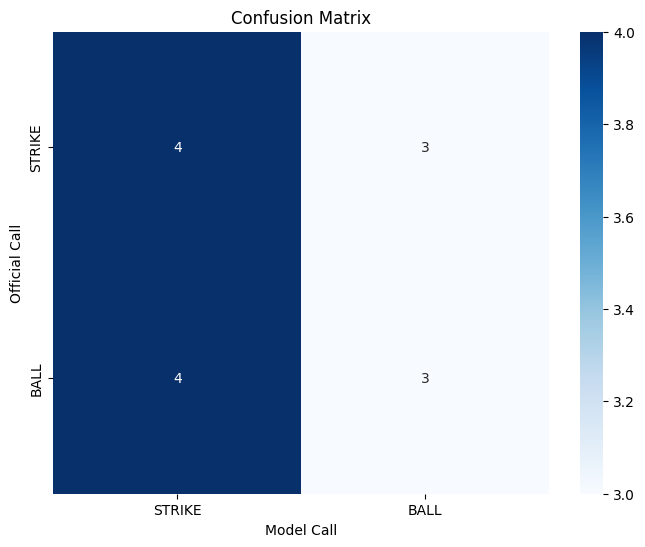

In [20]:
print("\n--- Final Step: Processing Videos with Line Segment Intersection Logic ---")

# --- Metadata including Ground Truth TV Strike Zones ---
video_metadata = {
    '0001.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Ohtani, Shoei', 'count': '0 - 0', 'official_call': 'STRIKE', 'tv_zone': (660, 240, 730, 325)},
    '0002.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Ohtani, Shoei', 'count': '0 - 1', 'official_call': 'STRIKE', 'tv_zone': (660, 240, 730, 325)},
    '0003.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Betts, Mookie', 'count': '0 - 0', 'official_call': 'STRIKE', 'tv_zone': (660, 240, 730, 325)},
    '0004.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '0 - 0', 'official_call': 'BALL', 'tv_zone': (660, 235, 730, 320)},
    '0005.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '1 - 1', 'official_call': 'BALL', 'tv_zone': (660, 228, 727, 318)},
    '0006.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '2 - 1', 'official_call': 'BALL', 'tv_zone': (665, 228, 725, 315)},
    '0007.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '3 - 1', 'official_call': 'BALL', 'tv_zone': (660, 228, 725, 325)},
    '0008.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Tatis Jr., Fernando', 'count': '0 - 1', 'official_call': 'BALL', 'tv_zone': (710,250, 770, 333)},
    '0009.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Tatis Jr., Fernando', 'count': '1 - 1', 'official_call': 'BALL', 'tv_zone': (710,250, 770, 333)},
    '0010.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Tatis Jr., Fernando', 'count': '2 - 1', 'official_call': 'BALL', 'tv_zone': (710,250, 770, 333)},
    '0011.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Arraez, Luis', 'count': '2 - 1', 'official_call': 'STRIKE', 'tv_zone': (710,285, 770, 355)},
    '0012.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Sheets, Gavin', 'count': '0 - 1', 'official_call': 'STRIKE', 'tv_zone': (710,270, 770, 342)},
    '0013.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Bogaerts, Xander', 'count': '0 - 0', 'official_call': 'STRIKE', 'tv_zone': (710,260, 765, 340)},
    '0014.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Wood, James', 'count': '0 - 0', 'official_call': 'STRIKE', 'tv_zone': (710,250, 770, 333)},
}
final_results = []
iou_scores = []

def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0]); yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2]); yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

def line_intersects_rect(p1, p2, rect):
    """Checks if the line segment from p1 to p2 intersects with rect."""
    x1, y1 = p1
    x2, y2 = p2
    rx, ry, rw, rh = rect[0], rect[1], rect[2]-rect[0], rect[3]-rect[1]

    # Check if either endpoint is inside the rect
    if (rx <= x1 <= rx + rw and ry <= y1 <= ry + rh) or \
       (rx <= x2 <= rx + rw and ry <= y2 <= ry + rh):
        return True

    # Check for intersection with each of the 4 rectangle sides
    for i in range(4):
        x3, y3 = (rx, ry) if i == 0 else (rx + rw, ry) if i == 1 else (rx + rw, ry + rh) if i == 2 else (rx, ry + rh)
        x4, y4 = (rx + rw, ry) if i == 0 else (rx + rw, ry + rh) if i == 1 else (rx, ry + rh) if i == 2 else (rx, ry)

        den = (x1 - x2) * (y3 - y4) - (y1 - y2) * (x3 - x4)
        if den == 0:
            continue

        t = ((x1 - x3) * (y3 - y4) - (y1 - y3) * (x3 - x4)) / den
        u = -((x1 - x2) * (y1 - y3) - (y1 - y2) * (x1 - x3)) / den

        if 0 < t < 1 and 0 < u < 1:
            return True

    return False

if video_paths and plate_detector_model and hitter_detector_model:
    generic_pose_model = YOLO('yolov8n-pose.pt')

    for video_path in video_paths:
        if video_path not in video_metadata:
            continue

        print(f"\n\n--- Processing video: {video_path} ---")

        cap = cv2.VideoCapture(video_path)
        width, height, fps = (int(cap.get(c)) for c in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))

        input_video_name = Path(video_path).stem
        output_video_path = PROJECT_ROOT / f'{input_video_name}_output.mp4'
        out = cv2.VideoWriter(str(output_video_path), cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

        frozen_strike_zone = None
        frozen_tv_zone = video_metadata[video_path].get('tv_zone')

        trajectories = {}
        frame_count = 0

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret: break
            frame_count += 1
            print(f"  Processing frame {frame_count}...")

            track_results = plate_detector_model.track(frame, persist=True, verbose=False)

            if frozen_strike_zone is None and track_results[0].boxes.id is not None:
                for box, track_id, cls_id in zip(track_results[0].boxes, track_results[0].boxes.id.int().cpu().tolist(), track_results[0].boxes.cls.int().cpu().tolist()):
                    if plate_detector_model.names[cls_id] == 'baseball' and box.conf[0] > 0.5:
                        print(f"  Ball first detected at frame {frame_count}. Freezing strike zone...")

                        hitter_results = hitter_detector_model(frame, verbose=False)
                        home_plate_box = next((b.xyxy[0].cpu().numpy() for b in track_results[0].boxes if plate_detector_model.names[int(b.cls[0])] == 'homeplate'), None)
                        hitter_box = next((b.xyxy[0].cpu().numpy() for b in hitter_results[0].boxes if hitter_detector_model.names[int(b.cls[0])] == 'hitter'), None)

                        if home_plate_box is not None and hitter_box is not None:
                            x1_h, y1_h, x2_h, y2_h = [int(c) for c in hitter_box]
                            hitter_crop = frame[y1_h:y2_h, x1_h:x2_h]
                            pose_results = generic_pose_model(hitter_crop, verbose=False)
                            if pose_results[0].keypoints:
                                hitter_keypoints = pose_results[0].keypoints.xy[0].cpu().numpy()
                                hitter_keypoints[:, 0] += x1_h; hitter_keypoints[:, 1] += y1_h
                                sz_left = int(home_plate_box[0]); sz_right = int(home_plate_box[2])
                                plate_top_y = int(home_plate_box[1])
                                shoulder_y = (hitter_keypoints[5][1] + hitter_keypoints[6][1]) / 2
                                hip_y = (hitter_keypoints[11][1] + hitter_keypoints[12][1]) / 2
                                sz_top = int((shoulder_y + hip_y) / 2)
                                sz_bottom = int(max(hitter_keypoints[13][1], hitter_keypoints[14][1]))
                                sz_bottom = min(sz_bottom, plate_top_y)
                                if sz_bottom > sz_top > 0:
                                    frozen_strike_zone = (sz_left, sz_top, sz_right, sz_bottom)
                                    print(f"  Strike Zone FROZEN: {frozen_strike_zone}")
                                    if frozen_tv_zone and frozen_tv_zone != (0,0,0,0):
                                        iou = calculate_iou(frozen_strike_zone, frozen_tv_zone)
                                        iou_scores.append(iou)
                                        print(f"  IoU Calculated: {iou:.2%}")
                        break

            if track_results[0].boxes.id is not None:
                for box, track_id, cls_id in zip(track_results[0].boxes, track_results[0].boxes.id.int().cpu().tolist(), track_results[0].boxes.cls.int().cpu().tolist()):
                    if plate_detector_model.names[cls_id] == 'baseball':
                        center_x = int((box.xyxy[0][0] + box.xyxy[0][2]) / 2)
                        center_y = int((box.xyxy[0][1] + box.xyxy[0][3]) / 2)
                        if track_id not in trajectories:
                            trajectories[track_id] = []
                        trajectories[track_id].append((center_x, center_y))

            if frozen_strike_zone:
                cv2.rectangle(frame, (frozen_strike_zone[0], frozen_strike_zone[1]), (frozen_strike_zone[2], frozen_strike_zone[3]), (0, 255, 255), 2)

            if frozen_tv_zone and frozen_tv_zone != (0,0,0,0):
                tv_l, tv_t, tv_r, tv_b = frozen_tv_zone
                for i in range(tv_t, tv_b, 15): cv2.line(frame, (tv_l, i), (tv_l, i+10), (255,255,255), 2)
                for i in range(tv_t, tv_b, 15): cv2.line(frame, (tv_r, i), (tv_r, i+10), (255,255,255), 2)
                for i in range(tv_l, tv_r, 15): cv2.line(frame, (i, tv_t), (i+10, tv_t), (255,255,255), 2)
                for i in range(tv_l, tv_r, 15): cv2.line(frame, (i, tv_b), (i+10, tv_b), (255,255,255), 2)

            if frozen_strike_zone and frozen_tv_zone and frozen_tv_zone != (0,0,0,0):
                inter_x1 = max(frozen_strike_zone[0], frozen_tv_zone[0]); inter_y1 = max(frozen_strike_zone[1], frozen_tv_zone[1])
                inter_x2 = min(frozen_strike_zone[2], frozen_tv_zone[2]); inter_y2 = min(frozen_strike_zone[3], frozen_tv_zone[3])
                if inter_x2 > inter_x1 and inter_y2 > inter_y1:
                    overlay = frame.copy()
                    cv2.rectangle(overlay, (inter_x1, inter_y1), (inter_x2, inter_y2), (0, 255, 0), -1)
                    cv2.addWeighted(overlay, 0.4, frame, 0.6, 0, frame)

            if trajectories:
                longest_trajectory_id = max(trajectories, key=lambda k: len(trajectories[k]))
                if len(trajectories[longest_trajectory_id]) > 1:
                    path = trajectories[longest_trajectory_id]
                    cv2.polylines(frame, [np.array(path, np.int32)], isClosed=False, color=(255, 0, 0), thickness=2)
            out.write(frame)

        # --- Make the final call ---
        final_call_text = "INCONCLUSIVE"
        is_strike = False
        if frozen_strike_zone and trajectories:
            longest_trajectory_id = max(trajectories, key=lambda k: len(trajectories[k]))
            ball_trajectory = trajectories[longest_trajectory_id]

            # Checking for line segment intersection
            if len(ball_trajectory) > 1:
                for i in range(len(ball_trajectory) - 1):
                    p1 = ball_trajectory[i]
                    p2 = ball_trajectory[i+1]
                    if line_intersects_rect(p1, p2, frozen_strike_zone):
                        is_strike = True
                        break
            final_call_text = "STRIKE" if is_strike else "BALL"

        current_video_info = video_metadata[video_path]
        current_video_info['model_call'] = final_call_text
        current_video_info['filename'] = Path(video_path).name
        final_results.append(current_video_info)

        cap.release()
        out.release()
        print(f"\nVideo processing complete for '{video_path}'. Output saved to: {output_video_path}")

    # --- Print the final summary table and metrics ---
    final_results.sort(key=lambda x: x['filename'])
    print("\n\n--- FINAL RESULTS SUMMARY ---")
    print("\nPITCHER: GERRIT COLE")
    for res in final_results:
        filename = res['filename']
        if int(Path(filename).stem) <= 7:
             print(f"{filename} Pitcher: {res['pitcher']:<20} | Hitter: {res['hitter']:<20} | Count: {res['count']:<5} | Official Call: {res['official_call']:<7} | Model Call: {res['model_call']}")

    print("\nPITCHER: SHOEI OHTANI")
    for res in final_results:
        filename = res['filename']
        if int(Path(filename).stem) > 7:
             print(f"{filename} Pitcher: {res['pitcher']:<20} | Hitter: {res['hitter']:<20} | Count: {res['count']:<5} | Official Call: {res['official_call']:<7} | Model Call: {res['model_call']}")

    y_true = [res['official_call'] for res in final_results]
    y_pred = [res['model_call'].split(' ')[0] for res in final_results]

    if y_true and y_pred:
        tp, fp, tn, fn = 0, 0, 0, 0
        for official, model in zip(y_true, y_pred):
            if model == "STRIKE" and official == "STRIKE": tp += 1
            elif model == "STRIKE" and official == "BALL": fp += 1
            elif model == "BALL" and official == "BALL": tn += 1
            elif model == "BALL" and official == "STRIKE": fn += 1

        total_calls = len(final_results)
        accuracy = (tp + tn) / total_calls if total_calls > 0 else 0
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

        print("\n\n--- PERFORMANCE METRICS ---")
        print(f"Total Pitches Analyzed: {total_calls}")
        print(f"Accuracy:  {accuracy:.2%}")
        print(f"Precision: {precision:.2%}")
        print(f"Recall:    {recall:.2%}")
        print(f"F1-Score:  {f1_score:.2%}")

        if iou_scores:
            mean_iou = np.mean(iou_scores)
            print(f"Mean Intersection over Union (IoU): {mean_iou:.2%}")

        print("--------------------------")

        # --- Plot Confusion Matrix ---
        cm = confusion_matrix(y_true, y_pred, labels=["STRIKE", "BALL"])
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=["STRIKE", "BALL"], yticklabels=["STRIKE", "BALL"])
        plt.xlabel('Model Call')
        plt.ylabel('Official Call')
        plt.title('Confusion Matrix')
        plt.show()



--- NEW METRICS WITH THE CORRECTED CALL MISJUDGED BY UMPIRE ---


--- Processing video: 0014.mp4 ---
  Processing frame 1...
  Processing frame 2...
  Processing frame 3...
  Processing frame 4...
  Processing frame 5...
  Processing frame 6...
  Processing frame 7...
  Processing frame 8...
  Processing frame 9...
  Processing frame 10...
  Processing frame 11...
  Processing frame 12...
  Processing frame 13...
  Processing frame 14...
  Processing frame 15...
  Processing frame 16...
  Processing frame 17...
  Processing frame 18...
  Processing frame 19...
  Processing frame 20...
  Processing frame 21...
  Processing frame 22...
  Processing frame 23...
  Processing frame 24...
  Processing frame 25...
  Processing frame 26...
  Processing frame 27...
  Processing frame 28...
  Processing frame 29...
  Processing frame 30...
  Processing frame 31...
  Processing frame 32...
  Processing frame 33...
  Processing frame 34...
  Ball first detected at frame 34. Freezing strike zone..

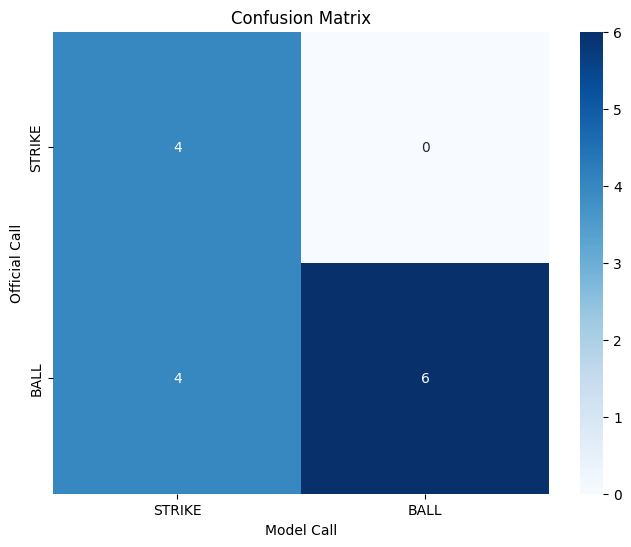

In [22]:
print("\n--- NEW METRICS WITH THE CORRECTED CALL MISJUDGED BY UMPIRE ---")

# --- Metadata with CORRECTED Ground Truth Calls ---
video_metadata = {
    '0001.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Ohtani, Shoei', 'count': '0 - 0', 'true_pitch_result': 'STRIKE', 'tv_zone': (660, 240, 730, 325)},
    '0002.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Ohtani, Shoei', 'count': '0 - 1', 'true_pitch_result': 'STRIKE', 'tv_zone': (660, 240, 730, 325)},
    '0003.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Betts, Mookie', 'count': '0 - 0', 'true_pitch_result': 'STRIKE', 'tv_zone': (660, 240, 730, 325)},
    '0004.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '0 - 0', 'true_pitch_result': 'BALL', 'tv_zone': (660, 235, 730, 320)},
    '0005.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '1 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (660, 228, 727, 318)},
    '0006.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '2 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (665, 228, 725, 315)},
    '0007.mp4': {'pitcher': 'Cole, Gerrit', 'hitter': 'Freeman, Freddie', 'count': '3 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (660, 228, 725, 325)},
    '0008.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Tatis Jr., Fernando', 'count': '0 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (710,250, 770, 333)},
    '0009.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Tatis Jr., Fernando', 'count': '1 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (710,250, 770, 333)},
    '0010.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Tatis Jr., Fernando', 'count': '2 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (710,250, 770, 333)},
    '0011.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Arraez, Luis', 'count': '2 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (710,285, 770, 355)},
    '0012.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Sheets, Gavin', 'count': '0 - 1', 'true_pitch_result': 'BALL', 'tv_zone': (710,270, 770, 342)},
    '0013.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Bogaerts, Xander', 'count': '0 - 0', 'true_pitch_result': 'BALL', 'tv_zone': (710,260, 765, 340)},
    '0014.mp4': {'pitcher': 'Ohtani, Shoei', 'hitter': 'Wood, James', 'count': '0 - 0', 'true_pitch_result': 'STRIKE', 'tv_zone': (710,250, 770, 333)},
}
final_results = []
iou_scores = []

def calculate_iou(boxA, boxB):
    xA = max(boxA[0], boxB[0]); yA = max(boxA[1], boxB[1])
    xB = min(boxA[2], boxB[2]); yB = min(boxA[3], boxB[3])
    interArea = max(0, xB - xA) * max(0, yB - yA)
    boxAArea = (boxA[2] - boxA[0]) * (boxA[3] - boxA[1])
    boxBArea = (boxB[2] - boxB[0]) * (boxB[3] - boxB[1])
    iou = interArea / float(boxAArea + boxBArea - interArea)
    return iou

def line_intersects_rect(p1, p2, rect):
    """Checks if the line segment from p1 to p2 intersects with rect."""
    x1, y1 = p1
    x2, y2 = p2
    rx, ry, rw, rh = rect[0], rect[1], rect[2]-rect[0], rect[3]-rect[1]

    if (rx <= x1 <= rx + rw and ry <= y1 <= ry + rh) or \
       (rx <= x2 <= rx + rw and ry <= y2 <= ry + rh):
        return True

    for i in range(4):
        x3, y3 = (rx, ry) if i == 0 else (rx + rw, ry) if i == 1 else (rx + rw, ry + rh) if i == 2 else (rx, ry + rh)
        x4, y4 = (rx + rw, ry) if i == 0 else (rx + rw, ry + rh) if i == 1 else (rx, ry + rh) if i == 2 else (rx, ry)

        den = (x1 - x2) * (y3 - y4) - (y1 - y2) * (x3 - x4)
        if den == 0:
            continue

        t = ((x1 - x3) * (y3 - y4) - (y1 - y3) * (x3 - x4)) / den
        u = -((x1 - x2) * (y1 - y3) - (y1 - y2) * (x1 - x3)) / den

        if 0 < t < 1 and 0 < u < 1:
            return True

    return False

if video_paths and plate_detector_model and hitter_detector_model:
    generic_pose_model = YOLO('yolov8n-pose.pt')

    for video_path in video_paths:
        if video_path not in video_metadata:
            continue

        print(f"\n\n--- Processing video: {video_path} ---")

        cap = cv2.VideoCapture(video_path)
        width, height, fps = (int(cap.get(c)) for c in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))

        input_video_name = Path(video_path).stem
        output_video_path = PROJECT_ROOT / f'{input_video_name}_output.mp4'
        out = cv2.VideoWriter(str(output_video_path), cv2.VideoWriter_fourcc(*'mp4v'), fps, (width, height))

        frozen_strike_zone = None
        frozen_tv_zone = video_metadata[video_path].get('tv_zone')

        trajectories = {}
        frame_count = 0

        while cap.isOpened():
            ret, frame = cap.read()
            if not ret: break
            frame_count += 1
            print(f"  Processing frame {frame_count}...")

            track_results = plate_detector_model.track(frame, persist=True, verbose=False)

            if frozen_strike_zone is None and track_results[0].boxes.id is not None:
                for box, track_id, cls_id in zip(track_results[0].boxes, track_results[0].boxes.id.int().cpu().tolist(), track_results[0].boxes.cls.int().cpu().tolist()):
                    if plate_detector_model.names[cls_id] == 'baseball' and box.conf[0] > 0.5:
                        print(f"  Ball first detected at frame {frame_count}. Freezing strike zone...")

                        hitter_results = hitter_detector_model(frame, verbose=False)
                        home_plate_box = next((b.xyxy[0].cpu().numpy() for b in track_results[0].boxes if plate_detector_model.names[int(b.cls[0])] == 'homeplate'), None)
                        hitter_box = next((b.xyxy[0].cpu().numpy() for b in hitter_results[0].boxes if hitter_detector_model.names[int(b.cls[0])] == 'hitter'), None)

                        if home_plate_box is not None and hitter_box is not None:
                            x1_h, y1_h, x2_h, y2_h = [int(c) for c in hitter_box]
                            hitter_crop = frame[y1_h:y2_h, x1_h:x2_h]
                            pose_results = generic_pose_model(hitter_crop, verbose=False)
                            if pose_results[0].keypoints:
                                hitter_keypoints = pose_results[0].keypoints.xy[0].cpu().numpy()
                                hitter_keypoints[:, 0] += x1_h; hitter_keypoints[:, 1] += y1_h
                                sz_left = int(home_plate_box[0]); sz_right = int(home_plate_box[2])
                                plate_top_y = int(home_plate_box[1])
                                shoulder_y = (hitter_keypoints[5][1] + hitter_keypoints[6][1]) / 2
                                hip_y = (hitter_keypoints[11][1] + hitter_keypoints[12][1]) / 2
                                sz_top = int((shoulder_y + hip_y) / 2)
                                sz_bottom = int(max(hitter_keypoints[13][1], hitter_keypoints[14][1]))
                                sz_bottom = min(sz_bottom, plate_top_y)
                                if sz_bottom > sz_top > 0:
                                    frozen_strike_zone = (sz_left, sz_top, sz_right, sz_bottom)
                                    print(f"  Strike Zone FROZEN: {frozen_strike_zone}")
                                    if frozen_tv_zone and frozen_tv_zone != (0,0,0,0):
                                        iou = calculate_iou(frozen_strike_zone, frozen_tv_zone)
                                        iou_scores.append(iou)
                                        print(f"  IoU Calculated: {iou:.2%}")
                        break

            if track_results[0].boxes.id is not None:
                for box, track_id, cls_id in zip(track_results[0].boxes, track_results[0].boxes.id.int().cpu().tolist(), track_results[0].boxes.cls.int().cpu().tolist()):
                    if plate_detector_model.names[cls_id] == 'baseball':
                        center_x = int((box.xyxy[0][0] + box.xyxy[0][2]) / 2)
                        center_y = int((box.xyxy[0][1] + box.xyxy[0][3]) / 2)
                        if track_id not in trajectories:
                            trajectories[track_id] = []
                        trajectories[track_id].append((center_x, center_y))

            if frozen_strike_zone:
                cv2.rectangle(frame, (frozen_strike_zone[0], frozen_strike_zone[1]), (frozen_strike_zone[2], frozen_strike_zone[3]), (0, 255, 255), 2)

            if frozen_tv_zone and frozen_tv_zone != (0,0,0,0):
                tv_l, tv_t, tv_r, tv_b = frozen_tv_zone
                for i in range(tv_t, tv_b, 15): cv2.line(frame, (tv_l, i), (tv_l, i+10), (255,255,255), 2)
                for i in range(tv_t, tv_b, 15): cv2.line(frame, (tv_r, i), (tv_r, i+10), (255,255,255), 2)
                for i in range(tv_l, tv_r, 15): cv2.line(frame, (i, tv_t), (i+10, tv_t), (255,255,255), 2)
                for i in range(tv_l, tv_r, 15): cv2.line(frame, (i, tv_b), (i+10, tv_b), (255,255,255), 2)

            if frozen_strike_zone and frozen_tv_zone and frozen_tv_zone != (0,0,0,0):
                inter_x1 = max(frozen_strike_zone[0], frozen_tv_zone[0]); inter_y1 = max(frozen_strike_zone[1], frozen_tv_zone[1])
                inter_x2 = min(frozen_strike_zone[2], frozen_tv_zone[2]); inter_y2 = min(frozen_strike_zone[3], frozen_tv_zone[3])
                if inter_x2 > inter_x1 and inter_y2 > inter_y1:
                    overlay = frame.copy()
                    cv2.rectangle(overlay, (inter_x1, inter_y1), (inter_x2, inter_y2), (0, 255, 0), -1)
                    cv2.addWeighted(overlay, 0.4, frame, 0.6, 0, frame)

            if trajectories:
                longest_trajectory_id = max(trajectories, key=lambda k: len(trajectories[k]))
                if len(trajectories[longest_trajectory_id]) > 1:
                    path = trajectories[longest_trajectory_id]
                    cv2.polylines(frame, [np.array(path, np.int32)], isClosed=False, color=(255, 0, 0), thickness=2)
            out.write(frame)

        # --- Make the final call ---
        final_call_text = "INCONCLUSIVE"
        is_strike = False
        if frozen_strike_zone and trajectories:
            longest_trajectory_id = max(trajectories, key=lambda k: len(trajectories[k]))
            ball_trajectory = trajectories[longest_trajectory_id]

            # Checking for line segment intersection
            if len(ball_trajectory) > 1:
                for i in range(len(ball_trajectory) - 1):
                    p1 = ball_trajectory[i]
                    p2 = ball_trajectory[i+1]
                    if line_intersects_rect(p1, p2, frozen_strike_zone):
                        is_strike = True
                        break
            final_call_text = "STRIKE" if is_strike else "BALL"

        current_video_info = video_metadata[video_path]
        current_video_info['model_call'] = final_call_text
        current_video_info['filename'] = Path(video_path).name
        final_results.append(current_video_info)

        cap.release()
        out.release()
        print(f"\nVideo processing complete for '{video_path}'. Output saved to: {output_video_path}")

    # --- Print the final summary table and metrics ---
    final_results.sort(key=lambda x: x['filename'])
    print("\n\n--- FINAL RESULTS SUMMARY ---")
    print("\nPITCHER: GERRIT COLE")
    for res in final_results:
        filename = res['filename']
        if int(Path(filename).stem) <= 7:
             meta = video_metadata[filename] # Use original metadata for display
             print(f"{filename} Pitcher: {meta['pitcher']:<20} | Hitter: {meta['hitter']:<20} | Count: {meta['count']:<5} | True Pitch Result: {meta['true_pitch_result']:<7} | Model Call: {res['model_call']}")

    print("\nPITCHER: SHOEI OHTANI")
    for res in final_results:
        filename = res['filename']
        if int(Path(filename).stem) > 7:
             meta = video_metadata[filename] # Use original metadata for display
             print(f"{filename} Pitcher: {meta['pitcher']:<20} | Hitter: {meta['hitter']:<20} | Count: {meta['count']:<5} | True Pitch Result: {meta['true_pitch_result']:<7} | Model Call: {res['model_call']}")

    y_true = [video_metadata[res['filename']]['true_pitch_result'] for res in final_results]
    y_pred = [res['model_call'].split(' ')[0] for res in final_results]

    if y_true and y_pred:
        tp, fp, tn, fn = 0, 0, 0, 0
        for official, model in zip(y_true, y_pred):
            if model == "STRIKE" and official == "STRIKE": tp += 1
            elif model == "STRIKE" and official == "BALL": fp += 1
            elif model == "BALL" and official == "BALL": tn += 1
            elif model == "BALL" and official == "STRIKE": fn += 1

        total_calls = len(final_results)
        accuracy = (tp + tn) / total_calls if total_calls > 0 else 0
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

        print("\n\n--- PERFORMANCE METRICS ---")
        print(f"Total Pitches Analyzed: {total_calls}")
        print(f"Accuracy:  {accuracy:.2%}")
        print(f"Precision: {precision:.2%}")
        print(f"Recall:    {recall:.2%}")
        print(f"F1-Score:  {f1_score:.2%}")

        if iou_scores:
            mean_iou = np.mean(iou_scores)
            print(f"Mean Intersection over Union (IoU): {mean_iou:.2%}")

        print("--------------------------")

        # --- Plot Confusion Matrix ---
        cm = confusion_matrix(y_true, y_pred, labels=["STRIKE", "BALL"])
        plt.figure(figsize=(8, 6))
        sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                    xticklabels=["STRIKE", "BALL"], yticklabels=["STRIKE", "BALL"])
        plt.xlabel('Model Call')
        plt.ylabel('Official Call')
        plt.title('Confusion Matrix')
        plt.show()
else:
    print("Could not run video processing. Prerequisite models or video file(s) are missing.")


In [23]:
# Definisci il nome del file zip finale
nome_file_zip = 'vFinale_vision_project'
# Definisci la cartella dove salvare temporaneamente i file da zippare
cartella_da_zippare = 'export_progetto'

# Crea la cartella di esportazione se non esiste
if os.path.exists(cartella_da_zippare):
    shutil.rmtree(cartella_da_zippare)
os.makedirs(cartella_da_zippare)

print(f"Cartella '{cartella_da_zippare}' creata.")

# --- Copia i modelli addestrati ---
percorso_runs = '/content/runs'
if os.path.exists(percorso_runs):
    shutil.copytree(percorso_runs, os.path.join(cartella_da_zippare, 'runs'))
    print("Cartella 'runs' con i modelli addestrati copiata.")

# --- Copia i video di output e le immagini finali ---
for file in os.listdir('/content'):
    if file.endswith('_output.mp4') or file.startswith('temp_final_validation_'):
        shutil.copy(os.path.join('/content', file), cartella_da_zippare)
print("Video di output e immagini di validazione copiati.")

# --- Copia il notebook stesso ---
# Assicurati che il nome del notebook sia corretto
nome_notebook = 'vision_project_notebook_setup.ipynb' # Cambia se il tuo notebook ha un nome diverso
if os.path.exists(f'/content/{nome_notebook}'):
    shutil.copy(f'/content/{nome_notebook}', cartella_da_zippare)
    print(f"Notebook '{nome_notebook}' copiato.")


# --- Crea il file zip ---
shutil.make_archive(nome_file_zip, 'zip', cartella_da_zippare)

print(f"\n Creato il file '{nome_file_zip}.zip' con tutti i risultati!")

print("\nStarting download...")
files.download(f'{nome_file_zip}.zip')

Cartella 'export_progetto' creata.
Cartella 'runs' con i modelli addestrati copiata.
Video di output e immagini di validazione copiati.

 Creato il file 'vFinale_vision_project.zip' con tutti i risultati!

Starting download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>